<a href="https://colab.research.google.com/github/xyaoaf/UrbanTreeStudywithLidar/blob/main/240403_clustering.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
pd.set_option('display.max_columns', None)
pd.set_option('display.float_format', '{:.2f}'.format)
import numpy as np
from sklearn.cluster import KMeans
import plotly.express as px
from sklearn.cluster import SpectralClustering
from sklearn.preprocessing import MinMaxScaler, RobustScaler
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.patches as mpatches

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/XihanYAO_GISDataShare/230318_Prediction.csv')
# export the dataframe to a CSV file

In [ ]:
df

,treeID,min_x,min_y,max_x,max_y,abv,all,min,max,avg,qav,std,ske,kur,hom,p10,p25,p50,p75,p90,b10,b20,b30,b40,b50,b60,b70,b80,b90,d00,d01,d02,cov_gap,dns_gap,height,crownArea,SArea,Min_Slope,Max_Slope,Avg_Slope,Z_Mean_FirstReturn,2018_R,2018_G,2018_B,2018_N,2020_R,2020_G,2020_B,2020_N,averageNDVI,1re,2re,3re,4re,FirstofManyre,LastofManyre,Lastre,NonFirstoverFirst,Intensity,Functional,Condition,Family,DBH
0,10003,527030.45,5043911.64,527034.10,5043912.86,46,100,2.68,2.91,2.87,8.23,0.04,-2.96,12.22,2.68,2.85,2.86,2.88,2.89,2.90,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.02,0.46,0.00,0.00,0.52,0.54,2.41,2.60,15.54,0.45,5698.07,875.34,1.36,55.82,88.93,61.68,221.14,111.17,122.33,115.17,86.50,0.24,46.00,0.00,0.00,0.00,2.00,0.00,44.00,0.00,43164.14,HEDGE,Good,HEDGE,8.41
1,10004,527245.03,5043901.88,527259.66,5043916.21,8679,11003,1.37,14.93,7.99,72.76,2.98,-0.23,2.19,1.37,3.69,5.82,8.25,10.30,11.78,0.04,0.15,0.22,0.33,0.49,0.65,0.81,0.94,0.99,0.14,0.22,0.42,0.17,0.21,11.35,139.17,1273.63,0.00,10000.00,1671.15,6.61,61.62,79.08,64.92,202.11,56.24,89.45,79.05,184.66,0.53,6025.00,2200.00,402.00,31.00,3071.00,1898.00,4852.00,0.44,33628.48,BD,Fair,Sapindaceae,18.35
2,10005,527344.70,5043902.50,527362.07,5043917.74,8936,10874,1.44,16.93,8.16,78.78,3.48,0.25,2.26,1.44,3.47,5.50,8.00,10.26,13.43,0.05,0.20,0.28,0.46,0.61,0.78,0.84,0.93,0.98,0.19,0.22,0.39,0.15,0.18,14.41,168.25,1121.49,0.00,10000.00,1244.77,7.16,46.58,53.65,59.16,175.47,45.34,67.62,73.77,170.05,0.58,5606.00,2523.00,551.00,66.00,3375.00,2303.00,4534.00,0.56,35488.29,BD,Fair,Sapindaceae,16.09
3,10006,527421.81,5043897.01,527442.54,5043917.74,12173,13477,1.38,20.67,14.60,230.76,4.20,-0.84,2.66,1.38,8.02,11.57,15.86,17.97,18.96,0.01,0.02,0.07,0.15,0.24,0.30,0.40,0.60,0.87,0.01,0.07,0.28,0.02,0.10,19.27,297.94,1331.66,0.14,10000.00,1511.67,13.89,45.64,68.58,58.75,209.19,44.47,83.14,73.68,189.25,0.63,8062.00,3145.00,656.00,77.00,3883.00,2540.00,6719.00,0.48,37336.65,BD,Fair,Fagaceae,32.17
4,10007,527151.76,5043901.58,527167.30,5043914.69,4660,5729,1.38,11.57,7.80,64.71,1.97,-0.93,3.61,1.38,5.22,6.57,8.28,9.28,9.92,0.02,0.04,0.06,0.11,0.24,0.38,0.55,0.81,0.98,0.06,0.29,0.45,0.15,0.19,9.69,97.46,700.19,0.00,10000.00,1402.57,5.97,57.55,72.19,67.12,201.59,53.13,81.30,77.64,187.81,0.56,3822.00,726.00,97.00,4.00,1154.00,630.00,3298.00,0.22,36624.30,BD,Fair,Sapindaceae,15.50
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12907,27621,538367.08,5039095.60,538371.66,5039103.22,513,917,1.42,22.70,9.54,141.68,7.13,0.43,1.78,1.42,1.75,2.17,8.91,14.85,20.50,0.31,0.43,0.47,0.53,0.72,0.74,0.76,0.79,0.92,0.13,0.03,0.15,0.40,0.44,7.66,13.56,246.34,0.07,10000.00,3906.60,6.81,136.60,147.34,135.88,210.39,113.46,134.63,114.78,188.78,0.23,417.00,83.00,8.00,1.00,305.00,33.00,145.00,0.22,30989.68,BD,Good,Cornaceae,9.77
12908,27623,538339.96,5039094.69,538346.36,5039100.17,308,862,1.48,21.27,9.28,109.77,4.88,0.58,3.01,1.48,3.33,5.56,9.14,11.84,17.50,0.10,0.24,0.40,0.51,0.54,0.90,0.90,0.90,0.95,0.05,0.07,0.17,0.57,0.64,5.93,16.17,277.07,0.12,10000.00,3781.20,5.10,165.63,160.12,158.66,192.75,141.14,147.91,131.79,173.26,0.09,262.00,41.00,5.00,0.00,247.00,10.00,25.00,0.18,29726.94,BD,Good,Cornaceae,11.77
12909,27625,538308.26,5039093.77,538311.61,5039097.12,137,389,2.09,20.93,9.58,112.64,4.59,0.14,3.27,2.09,2.54,6.77,11.29,11.49,11.60,0.20,0.22,0.26,0.34,0.43,0.93,0.93,0.93,0.96,0.08,0.02,0.23,0.61,0.65,4.13,6.22,91.12,0.20,8227.38,2632.09,4.00,175.43,169.66,168.01,189.06,176.60,175.90,162.10,144.40,-0.03,126.00,9.00,2.00,0.00,116.00,1.00,11.00,0.09,30093.06,BD,Good,Rosaceae,9.22
12910,27627,538247.30,5039092.86,538252.48,5039096.21,322,654,1.47,19.59,7.68,86.12,5.21,0.34,2.18,1.47,1.81,2.02,9.07,11.32,11.53,0.38,0.41,0.45,0.48,0.55,0.92,0.92,0.93,0.95,0.08,0.03,0.22,0.41,0.51,6.09,9.94,190.38,0.00,6532.73,302

# EDA

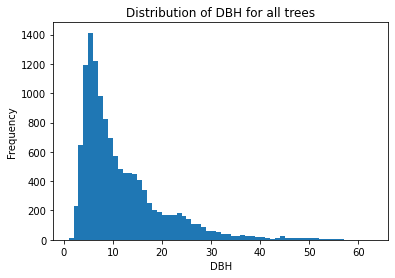

In [ ]:
# round the values in the column to the nearest integer
dfvisual = df['DBH'].round()

# calculate the minimum and maximum values of the column
min_value = int(dfvisual.min())
max_value = int(dfvisual.max())

# create bins with a width of 1
bins = range(min_value, max_value + 2, 1)

# plot the histogram
plt.hist(dfvisual, bins=bins)

# set the title and labels for the plot
plt.title('Distribution of DBH for all trees')
plt.xlabel('DBH')
plt.ylabel('Frequency')

# show the plot
plt.show()

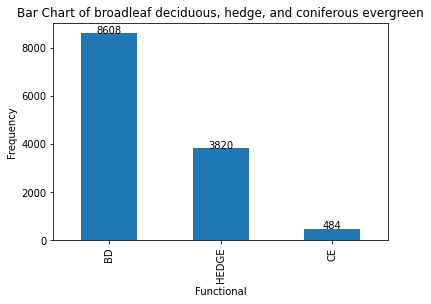

In [ ]:
# count the frequency of each category in the column
category_counts = df['Functional'].value_counts()

# create a bar chart of the category counts
category_counts.plot.bar()

# create a bar chart of the category counts
ax = category_counts.plot.bar()

# set the title and labels for the plot
plt.title('Bar Chart of broadleaf deciduous, hedge, and coniferous evergreen')
plt.xlabel('Functional')
plt.ylabel('Frequency')

# add text labels for the counts on each bar
for i, v in enumerate(category_counts.values):
    ax.text(i, v + 0.2, str(v), ha='center')

# show the plot
plt.show()

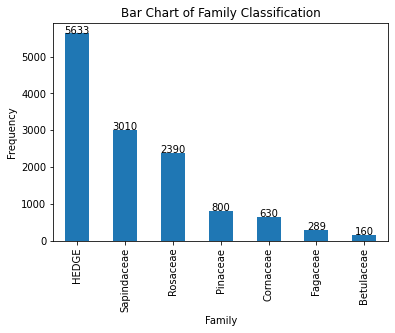

In [ ]:
# count the frequency of each category in the column
category_counts = df['Family'].value_counts()

# create a bar chart of the category counts
category_counts.plot.bar()

# create a bar chart of the category counts
ax = category_counts.plot.bar()

# set the title and labels for the plot
plt.title('Bar Chart of Family Classification')
plt.xlabel('Family')
plt.ylabel('Frequency')

# add text labels for the counts on each bar
for i, v in enumerate(category_counts.values):
    ax.text(i, v + 0.2, str(v), ha='center')

# show the plot
plt.show()

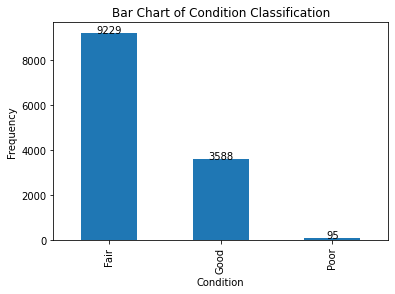

In [ ]:
# count the frequency of each category in the column
category_counts = df['Condition'].value_counts()

# create a bar chart of the category counts
category_counts.plot.bar()

# create a bar chart of the category counts
ax = category_counts.plot.bar()

# set the title and labels for the plot
plt.title('Bar Chart of Condition Classification')
plt.xlabel('Condition')
plt.ylabel('Frequency')

# add text labels for the counts on each bar
for i, v in enumerate(category_counts.values):
    ax.text(i, v + 0.2, str(v), ha='center')

# show the plot
plt.show()

# Plotting

In [ ]:
# import matplotlib.pyplot as plt
# # Filter the dataframe based on treeID
# dfW = df[df['treeID'] < 20000]
# # Set the figure size
# plt.figure(figsize=(8,8))
# # Plot the points on a scatter plot
# plt.scatter(dfW['min_x'], dfW['min_y'], s=0)
# # Plot the rectangles
# for index, row in dfW.iterrows():
#     rect = plt.Rectangle((row['min_x'], row['min_y']), row['max_x']-row['min_x'], row['max_y']-row['min_y'], fill=None, alpha=1, edgecolor='r')
#     plt.gca().add_patch(rect)
# # Add axis labels and a title
# plt.xlabel('X Axis')
# plt.ylabel('Y Axis')
# plt.title('Scatter plot of points with rectangles')
# # Set the aspect ratio to equal
# plt.gca().set_aspect('equal', adjustable='box')
# # Show the plot
# plt.show()

In [ ]:
# import matplotlib.pyplot as plt
# from matplotlib.patches import Ellipse
# # Filter the dataframe based on treeID
# dfW = df[df['treeID'] < 20000]
# # Set the figure size
# plt.figure(figsize=(8,8))
# # Plot the points on a scatter plot
# plt.scatter(dfW['min_x'], dfW['min_y'], s=0)
# # Plot the ellipsoids
# for index, row in dfW.iterrows():
#     center_x = (row['max_x'] + row['min_x']) / 2
#     center_y = (row['max_y'] + row['min_y']) / 2
#     width = row['max_x'] - row['min_x']
#     height = row['max_y'] - row['min_y']
#     ellipse = Ellipse(xy=(center_x, center_y), width=width, height=height, fill=None, alpha=1, edgecolor='r')
#     plt.gca().add_patch(ellipse)
# # Add axis labels and a title
# plt.xlabel('X Axis')
# plt.ylabel('Y Axis')
# plt.title('Scatter plot of points with ellipsoids')
# # Set the aspect ratio to equal
# plt.gca().set_aspect('equal', adjustable='box')
# # Show the plot
# plt.show()

<ipython-input-11-d9a87fd1d020>:37: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm)


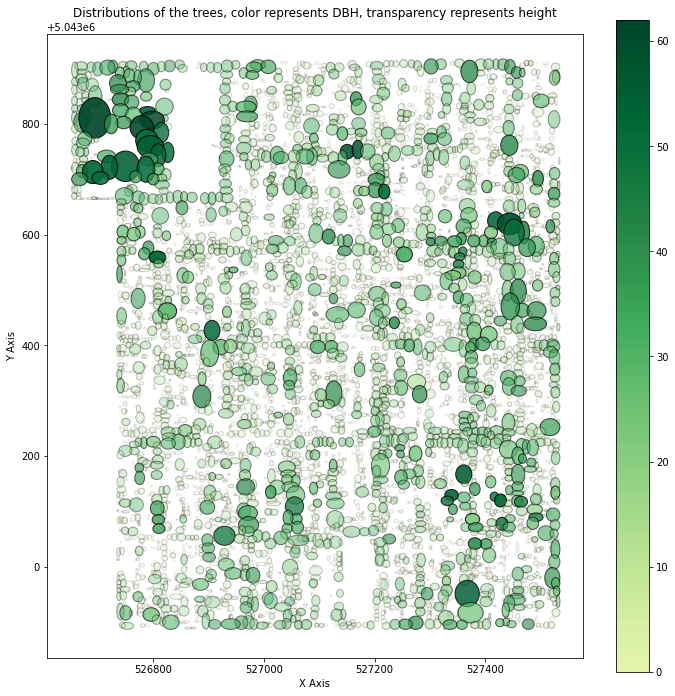

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse
from matplotlib.colors import LinearSegmentedColormap

# Define a custom colormap that goes from light green to dark green using the "gist_earth_r" colormap
cmap = LinearSegmentedColormap.from_list('Custom', plt.cm.YlGn(np.linspace(0.2, 1, 256)), N=256)

# Filter the dataframe based on treeID
dfW = df[df['treeID'] < 20000]

# Set the figure size
plt.figure(figsize=(12,12))

# Plot the points on a scatter plot
plt.scatter(dfW['min_x'], dfW['min_y'], s=0)

# Plot the ellipsoids
for index, row in dfW.iterrows():
    color = cmap(row['DBH'] / dfW['DBH'].max())  # Color based on value in column 10
    alpha = (row['height'] / dfW['height'].max())  # Alpha based on value in another column
    ell = Ellipse(xy=(row['min_x']+(row['max_x']-row['min_x'])/2, row['min_y']+(row['max_y']-row['min_y'])/2), width=row['max_x']-row['min_x'], height=row['max_y']-row['min_y'], angle=0, alpha=alpha)
    ell.set_facecolor(color)
    ell.set_edgecolor('black')
    plt.gca().add_artist(ell)

# Add axis labels and a title
plt.xlabel('X Axis')
plt.ylabel('Y Axis')
plt.title('Distributions of the trees, color represents DBH, transparency represents height')

# Set the aspect ratio to equal
plt.gca().set_aspect('equal', adjustable='box')

# Set the colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=0, vmax=dfW["DBH"].max()))
sm._A = []
cbar = plt.colorbar(sm)

# Show the plot
plt.show()


<ipython-input-12-85114ce91c39>:37: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm)


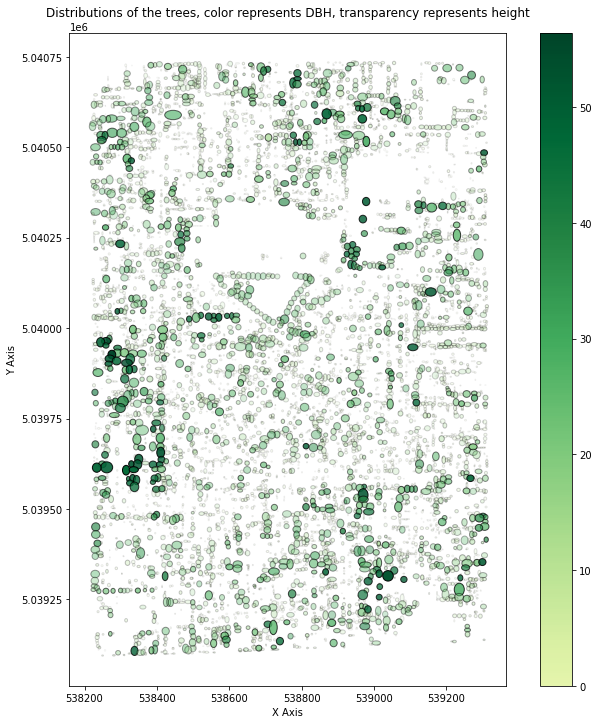

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse
from matplotlib.colors import LinearSegmentedColormap

# Define a custom colormap that goes from light green to dark green using the "gist_earth_r" colormap
cmap = LinearSegmentedColormap.from_list('Custom', plt.cm.YlGn(np.linspace(0.2, 1, 256)), N=256)

# Filter the dataframe based on treeID
dfW = df[df['treeID'] > 20000]

# Set the figure size
plt.figure(figsize=(12,12))

# Plot the points on a scatter plot
plt.scatter(dfW['min_x'], dfW['min_y'], s=0)

# Plot the ellipsoids
for index, row in dfW.iterrows():
    color = cmap(row['DBH'] / dfW['DBH'].max())  # Color based on value in column 10
    alpha = (row['height'] / dfW['height'].max())  # Alpha based on value in another column
    ell = Ellipse(xy=(row['min_x']+(row['max_x']-row['min_x'])/2, row['min_y']+(row['max_y']-row['min_y'])/2), width=row['max_x']-row['min_x'], height=row['max_y']-row['min_y'], angle=0, alpha=alpha)
    ell.set_facecolor(color)
    ell.set_edgecolor('black')
    plt.gca().add_artist(ell)

# Add axis labels and a title
plt.xlabel('X Axis')
plt.ylabel('Y Axis')
plt.title('Distributions of the trees, color represents DBH, transparency represents height')

# Set the aspect ratio to equal
plt.gca().set_aspect('equal', adjustable='box')

# Set the colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=0, vmax=dfW["DBH"].max()))
sm._A = []
cbar = plt.colorbar(sm)

# Show the plot
plt.show()


<ipython-input-13-011210cb393a>:44: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm)
<ipython-input-13-011210cb393a>:45: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.set_ticklabels([category_names[i] for i in range(num_categories)])


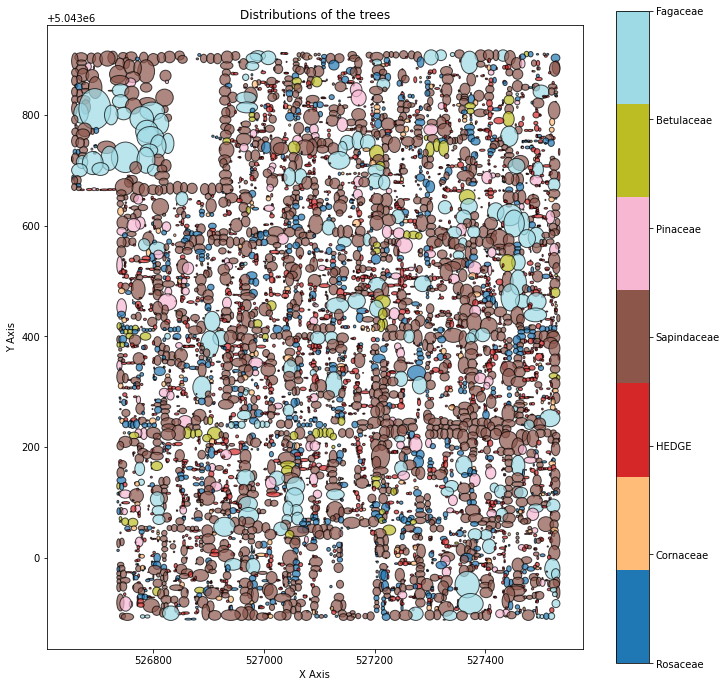

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse
from matplotlib.colors import ListedColormap

# Get the unique categories in the 'Family' column
categories = dfW['Family'].unique()

# Define a colormap with a unique color for each category
num_categories = len(categories)
cmap = ListedColormap(plt.cm.tab20(np.linspace(0, 1, num_categories)))

# Create a dictionary that maps the category index to its corresponding name in the 'Family' column
category_names = {i: name for i, name in enumerate(categories)}

# Filter the dataframe based on treeID
dfW = df[df['treeID'] < 20000]

# Set the figure size
plt.figure(figsize=(12,12))

# Plot the points on a scatter plot
plt.scatter(dfW['min_x'], dfW['min_y'], s=0)

# Plot the ellipsoids
for index, row in dfW.iterrows():
    category_index = np.where(categories == row['Family'])[0][0]  # Get the index of the category in the colormap
    alpha = (row['height'] / dfW['height'].max())  # Alpha based on value in another column
    ell = Ellipse(xy=(row['min_x']+(row['max_x']-row['min_x'])/2, row['min_y']+(row['max_y']-row['min_y'])/2), width=row['max_x']-row['min_x'], height=row['max_y']-row['min_y'], angle=0, alpha=0.7)
    ell.set_facecolor(cmap(category_index))
    ell.set_edgecolor('black')
    plt.gca().add_artist(ell)

# Add axis labels and a title
plt.xlabel('X Axis')
plt.ylabel('Y Axis')
plt.title('Distributions of the trees')

# Set the aspect ratio to equal
plt.gca().set_aspect('equal', adjustable='box')

# Set the colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=0, vmax=num_categories-1))
sm._A = []
cbar = plt.colorbar(sm)
cbar.set_ticklabels([category_names[i] for i in range(num_categories)])

# Show the plot
plt.show()

<ipython-input-14-7b4cf278f96c>:44: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm)
<ipython-input-14-7b4cf278f96c>:45: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.set_ticklabels([category_names[i] for i in range(num_categories)])


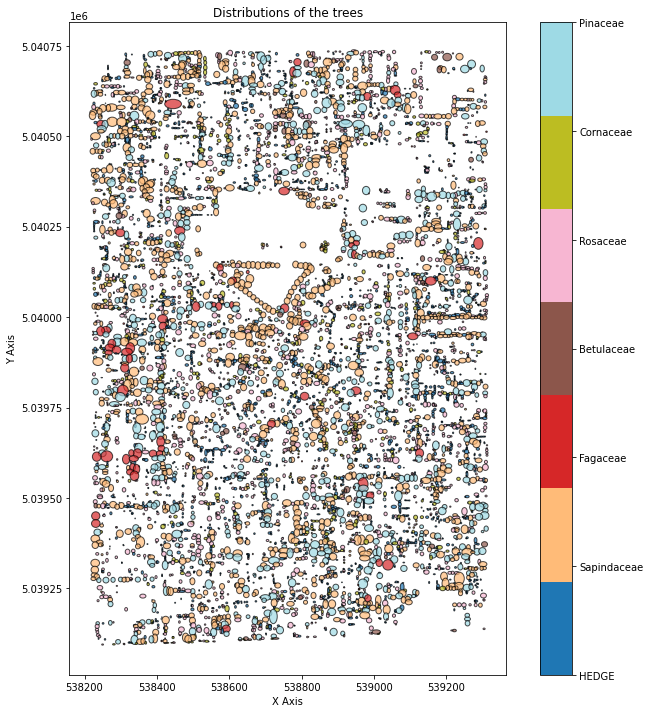

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse
from matplotlib.colors import ListedColormap

# Get the unique categories in the 'Family' column
categories = dfW['Family'].unique()

# Define a colormap with a unique color for each category
num_categories = len(categories)
cmap = ListedColormap(plt.cm.tab20(np.linspace(0, 1, num_categories)))

# Create a dictionary that maps the category index to its corresponding name in the 'Family' column
category_names = {i: name for i, name in enumerate(categories)}

# Filter the dataframe based on treeID
dfW = df[df['treeID'] > 20000]

# Set the figure size
plt.figure(figsize=(12,12))

# Plot the points on a scatter plot
plt.scatter(dfW['min_x'], dfW['min_y'], s=0)

# Plot the ellipsoids
for index, row in dfW.iterrows():
    category_index = np.where(categories == row['Family'])[0][0]  # Get the index of the category in the colormap
    alpha = (row['height'] / dfW['height'].max())  # Alpha based on value in another column
    ell = Ellipse(xy=(row['min_x']+(row['max_x']-row['min_x'])/2, row['min_y']+(row['max_y']-row['min_y'])/2), width=row['max_x']-row['min_x'], height=row['max_y']-row['min_y'], angle=0, alpha=0.7)
    ell.set_facecolor(cmap(category_index))
    ell.set_edgecolor('black')
    plt.gca().add_artist(ell)

# Add axis labels and a title
plt.xlabel('X Axis')
plt.ylabel('Y Axis')
plt.title('Distributions of the trees')

# Set the aspect ratio to equal
plt.gca().set_aspect('equal', adjustable='box')

# Set the colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=0, vmax=num_categories-1))
sm._A = []
cbar = plt.colorbar(sm)
cbar.set_ticklabels([category_names[i] for i in range(num_categories)])

# Show the plot
plt.show()


In [ ]:
import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse
from matplotlib.colors import ListedColormap

def plot_tree_distributions(df, category, treeID_range):
    # Get the unique categories in the specified column
    categories = df[category].unique()

    # Define a colormap with a unique color for each category
    num_categories = len(categories)
    cmap = ListedColormap(plt.cm.tab20(np.linspace(0, 1, num_categories)))

    # Create a dictionary that maps the category index to its corresponding name in the specified column
    category_names = {i: name for i, name in enumerate(categories)}

    # Filter the dataframe based on the specified treeID range
    df = df[(df['treeID'] >= treeID_range[0]) & (df['treeID'] < treeID_range[1])]

    # Set the figure size
    plt.figure(figsize=(6,6))

    # Plot the points on a scatter plot
    plt.scatter(df['min_x'], df['min_y'], s=0)

    # Plot the ellipsoids
    for index, row in df.iterrows():
        category_index = np.where(categories == row[category])[0][0]  # Get the index of the category in the colormap
        alpha = (row['height'] / df['height'].max())  # Alpha based on value in another column
        ell = Ellipse(xy=(row['min_x']+(row['max_x']-row['min_x'])/2, row['min_y']+(row['max_y']-row['min_y'])/2), width=row['max_x']-row['min_x'], height=row['max_y']-row['min_y'], angle=0, alpha=0.7)
        ell.set_facecolor(cmap(category_index))
        ell.set_edgecolor('black')
        plt.gca().add_artist(ell)

    # Add axis labels and a title
    plt.xlabel('X Axis')
    plt.ylabel('Y Axis')
    plt.title('Distributions of the trees')

    # Set the aspect ratio to equal
    plt.gca().set_aspect('equal', adjustable='box')

    # Set the colorbar
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=0, vmax=num_categories-1))
    sm._A = []
    cbar = plt.colorbar(sm)
    cbar.set_ticklabels([category_names[i] for i in range(num_categories)])

    # Show the plot
    plt.show()


<ipython-input-15-fce64638d895>:45: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm)
<ipython-input-15-fce64638d895>:46: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.set_ticklabels([category_names[i] for i in range(num_categories)])


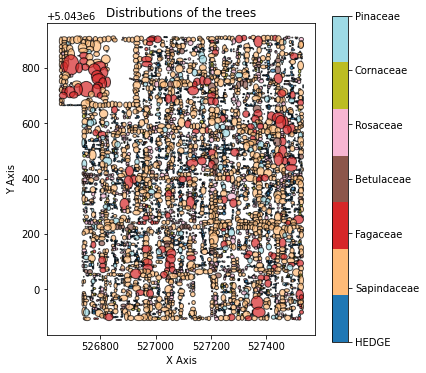

In [ ]:
plot_tree_distributions(df, "Family", [0,20000])

<ipython-input-15-fce64638d895>:45: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm)
<ipython-input-15-fce64638d895>:46: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.set_ticklabels([category_names[i] for i in range(num_categories)])


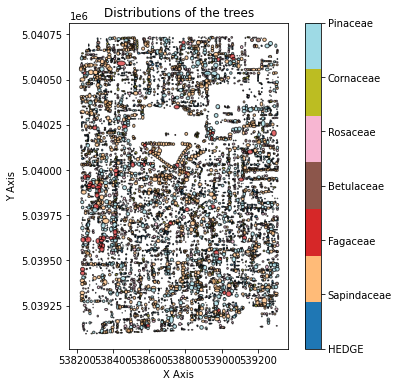

In [ ]:
plot_tree_distributions(df, "Family", [20000,30000])

<ipython-input-15-fce64638d895>:45: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm)
<ipython-input-15-fce64638d895>:46: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.set_ticklabels([category_names[i] for i in range(num_categories)])


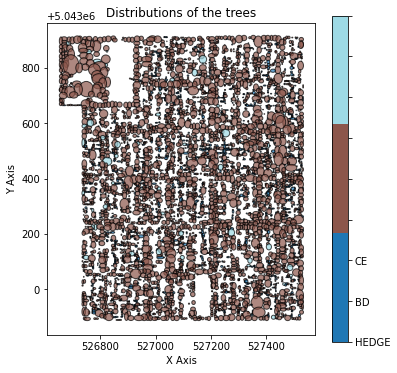

In [ ]:
plot_tree_distributions(df, "Functional", [0,20000])

<ipython-input-15-fce64638d895>:45: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm)
<ipython-input-15-fce64638d895>:46: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.set_ticklabels([category_names[i] for i in range(num_categories)])


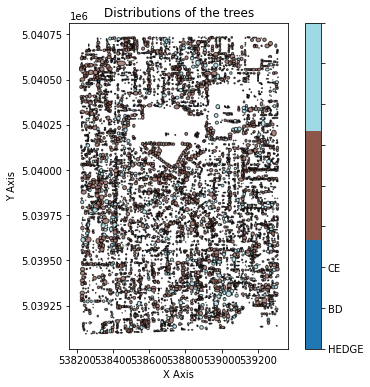

In [ ]:
plot_tree_distributions(df, "Functional", [20000,30000])

<ipython-input-15-fce64638d895>:45: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm)
<ipython-input-15-fce64638d895>:46: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.set_ticklabels([category_names[i] for i in range(num_categories)])


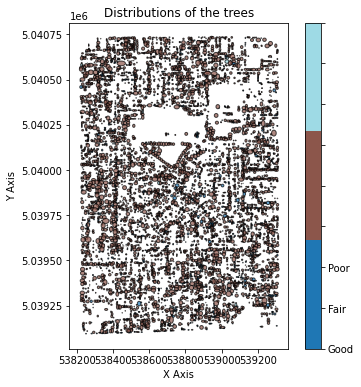

In [ ]:
plot_tree_distributions(df, "Condition", [20000,30000])

<ipython-input-15-fce64638d895>:45: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm)
<ipython-input-15-fce64638d895>:46: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.set_ticklabels([category_names[i] for i in range(num_categories)])


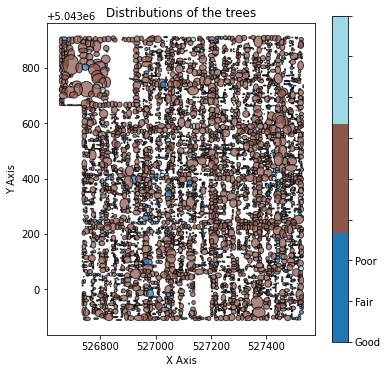

In [ ]:
plot_tree_distributions(df, "Condition", [0,20000])

# Clustering hedge + 3

In [ ]:
## checked
# df

In [ ]:
dfHEDGE = df.loc[df['Family'] == 'HEDGE']
dfnonHEDGE = subset = df.loc[df['Family'] != 'HEDGE']

# Select the columns you want to use for clustering
subset = dfnonHEDGE[['height', 'crownArea', 'DBH']]

# Create a scaler object and fit it to the data
scaler = RobustScaler()
scaler.fit(subset)

# Transform the data using the scaler object
normalized_data = scaler.transform(subset)

# Increase the weight of the 'height' column by multiplying it by a factor
normalized_data[:,0] *= 2

# Perform k-means clustering with 3 clusters
kmeans = KMeans(n_clusters=3).fit(normalized_data)

# Add a new column to the original dataframe with the cluster labels
dfnonHEDGE['Cluster'] = kmeans.labels_
dfHEDGE['Cluster'] = 4

# Merge the two dataframes together
merged_df = pd.merge(dfHEDGE, dfnonHEDGE, how='outer')

# Sort the merged dataframe by values in the 'height' column
df = merged_df.sort_values('treeID')
df

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
<ipython-input-23-13931868328a>:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfnonHEDGE['Cluster'] = kmeans.labels_
<ipython-input-23-13931868328a>:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfHEDGE['Cluster'] = 4


,treeID,min_x,min_y,max_x,max_y,abv,all,min,max,avg,qav,std,ske,kur,hom,p10,p25,p50,p75,p90,b10,b20,b30,b40,b50,b60,b70,b80,b90,d00,d01,d02,cov_gap,dns_gap,height,crownArea,SArea,Min_Slope,Max_Slope,Avg_Slope,Z_Mean_FirstReturn,2018_R,2018_G,2018_B,2018_N,2020_R,2020_G,2020_B,2020_N,averageNDVI,1re,2re,3re,4re,FirstofManyre,LastofManyre,Lastre,NonFirstoverFirst,Intensity,Functional,Condition,Family,DBH,Cluster
0,10003,527030.45,5043911.64,527034.10,5043912.86,46,100,2.68,2.91,2.87,8.23,0.04,-2.96,12.22,2.68,2.85,2.86,2.88,2.89,2.90,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.02,0.46,0.00,0.00,0.52,0.54,2.41,2.60,15.54,0.45,5698.07,875.34,1.36,55.82,88.93,61.68,221.14,111.17,122.33,115.17,86.50,0.24,46.00,0.00,0.00,0.00,2.00,0.00,44.00,0.00,43164.14,HEDGE,Good,HEDGE,8.41,4
5633,10004,527245.03,5043901.88,527259.66,5043916.21,8679,11003,1.37,14.93,7.99,72.76,2.98,-0.23,2.19,1.37,3.69,5.82,8.25,10.30,11.78,0.04,0.15,0.22,0.33,0.49,0.65,0.81,0.94,0.99,0.14,0.22,0.42,0.17,0.21,11.35,139.17,1273.63,0.00,10000.00,1671.15,6.61,61.62,79.08,64.92,202.11,56.24,89.45,79.05,184.66,0.53,6025.00,2200.00,402.00,31.00,3071.00,1898.00,4852.00,0.44,33628.48,BD,Fair,Sapindaceae,18.35,2
5634,10005,527344.70,5043902.50,527362.07,5043917.74,8936,10874,1.44,16.93,8.16,78.78,3.48,0.25,2.26,1.44,3.47,5.50,8.00,10.26,13.43,0.05,0.20,0.28,0.46,0.61,0.78,0.84,0.93,0.98,0.19,0.22,0.39,0.15,0.18,14.41,168.25,1121.49,0.00,10000.00,1244.77,7.16,46.58,53.65,59.16,175.47,45.34,67.62,73.77,170.05,0.58,5606.00,2523.00,551.00,66.00,3375.00,2303.00,4534.00,0.56,35488.29,BD,Fair,Sapindaceae,16.09,2
5635,10006,527421.81,5043897.01,527442.54,5043917.74,12173,13477,1.38,20.67,14.60,230.76,4.20,-0.84,2.66,1.38,8.02,11.57,15.86,17.97,18.96,0.01,0.02,0.07,0.15,0.24,0.30,0.40,0.60,0.87,0.01,0.07,0.28,0.02,0.10,19.27,297.94,1331.66,0.14,10000.00,1511.67,13.89,45.64,68.58,58.75,209.19,44.47,83.14,73.68,189.25,0.63,8062.00,3145.00,656.00,77.00,3883.00,2540.00,6719.00,0.48,37336.65,BD,Fair,Fagaceae,32.17,1
5636,10007,527151.76,5043901.58,527167.30,5043914.69,4660,5729,1.38,11.57,7.80,64.71,1.97,-0.93,3.61,1.38,5.22,6.57,8.28,9.28,9.92,0.02,0.04,0.06,0.11,0.24,0.38,0.55,0.81,0.98,0.06,0.29,0.45,0.15,0.19,9.69,97.46,700.19,0.00,10000.00,1402.57,5.97,57.55,72.19,67.12,201.59,53.13,81.30,77.64,187.81,0.56,3822.00,726.00,97.00,4.00,1154.00,630.00,3298.00,0.22,36624.30,BD,Fair,Sapindaceae,15.50,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12907,27621,538367.08,5039095.60,538371.66,5039103.22,513,917,1.42,22.70,9.54,141.68,7.13,0.43,1.78,1.42,1.75,2.17,8.91,14.85,20.50,0.31,0.43,0.47,0.53,0.72,0.74,0.76,0.79,0.92,0.13,0.03,0.15,0.40,0.44,7.66,13.56,246.34,0.07,10000.00,3906.60,6.81,136.60,147.34,135.88,210.39,113.46,134.63,114.78,188.78,0.23,417.00,83.00,8.00,1.00,305.00,33.00,145.00,0.22,30989.68,BD,Good,Cornaceae,9.77,0
12908,27623,538339.96,5039094.69,538346.36,5039100.17,308,862,1.48,21.27,9.28,109.77,4.88,0.58,3.01,1.48,3.33,5.56,9.14,11.84,17.50,0.10,0.24,0.40,0.51,0.54,0.90,0.90,0.90,0.95,0.05,0.07,0.17,0.57,0.64,5.93,16.17,277.07,0.12,10000.00,3781.20,5.10,165.63,160.12,158.66,192.75,141.14,147.91,131.79,173.26,0.09,262.00,41.00,5.00,0.00,247.00,10.00,25.00,0.18,29726.94,BD,Good,Cornaceae,11.77,0
12909,27625,538308.26,5039093.77,538311.61,5039097.12,137,389,2.09,20.93,9.58,112.64,4.59,0.14,3.27,2.09,2.54,6.77,11.29,11.49,11.60,0.20,0.22,0.26,0.34,0.43,0.93,0.93,0.93,0.96,0.08,0.02,0.23,0.61,0.65,4.13,6.22,91.12,0.20,8227.38,2632.09,4.00,175.43,169.66,168.01,189.06,176.60,175.90,162.10,144.40,-0.03,126.00,9.00,2.00,0.00,116.00,1.00,11.00,0.09,30093.06,BD,Good,Rosaceae,9.22,0
12910,27627,538247.30,5039092.86,538252.48,5039096.21,322,654,1.47,19.59,7.68,86.12,5.21,0.34,2.18,1.47,1.81,2.02,9.07,11.32,11.53,0.38,0.41,0.45,0.48,0.55,0.92,0.92,0.93,0.95,0.08,0.03,0.22,0.4

In [ ]:
# Filter out the extreme value outliers
df1 = df[(df['DBH'] >= df['DBH'].quantile(0.01)) & (df['DBH'] <= df['DBH'].quantile(0.99))]
df1 = df1[(df1['crownArea'] >= df1['crownArea'].quantile(0.01)) & (df1['crownArea'] <= df1['crownArea'].quantile(0.99))]
df1 = df1[(df1['height'] >= df1['height'].quantile(0.01)) & (df1['height'] <= df1['height'].quantile(0.99))]

# Create an interactive 3D scatter plot with the cluster labels represented by color
fig = px.scatter_3d(df1, x='DBH', y='crownArea', z='height', color='Cluster',)
fig.show()

In [ ]:
# after each random model was generated, use this line of code to assign 0 to shrub, 1 to small, 2 to middle and 3 to old
df['Cluster'] = df['Cluster'].replace({0:1, 1:3, 2:2, 4:0})

In [ ]:
# Filter out the extreme value outliers
df1 = df[(df['DBH'] >= df['DBH'].quantile(0.01)) & (df['DBH'] <= df['DBH'].quantile(0.99))]
df1 = df1[(df1['crownArea'] >= df1['crownArea'].quantile(0.01)) & (df1['crownArea'] <= df1['crownArea'].quantile(0.99))]
df1 = df1[(df1['height'] >= df1['height'].quantile(0.01)) & (df1['height'] <= df1['height'].quantile(0.99))]

# Create an interactive 3D scatter plot with the cluster labels represented by color
fig = px.scatter_3d(df1, x='DBH', y='crownArea', z='height', color='Cluster',)
fig.show()

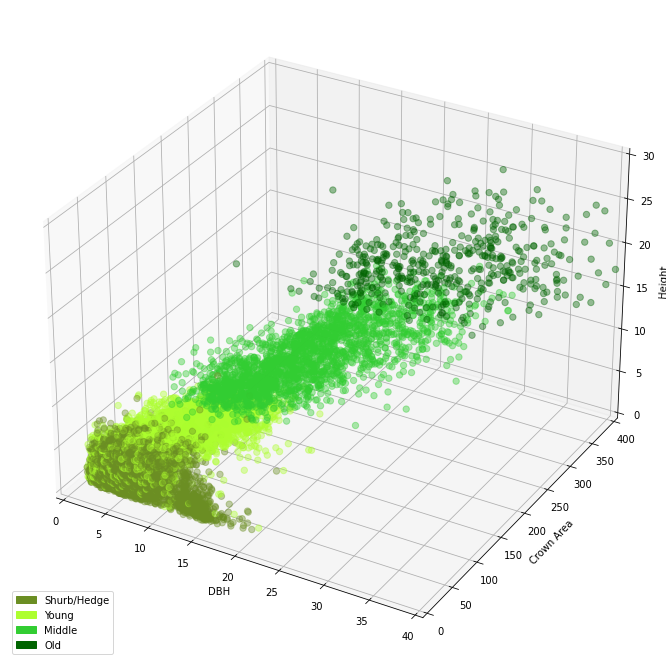

In [ ]:


# Define the colormap for the clusters
cluster_colors = ListedColormap(['olivedrab', 'greenyellow', 'limegreen', 'darkgreen'])



# Define the mapping from cluster labels to names
cluster_names = {0: 'Shurb/Hedge', 1: 'Young', 2: 'Middle', 3: 'Old'}

# Create a 3D scatter plot with the cluster labels represented by color
fig = plt.figure(figsize=(15, 12))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(df1['DBH'], df1['crownArea'], df1['height'], c=df1['Cluster'], s=40, alpha=0.4, cmap=cluster_colors)

# Add axis labels
ax.set_xlabel('DBH')
ax.set_ylabel('Crown Area')
ax.set_zlabel('Height')

# Create custom legend handles and labels
handles = []
labels = []
for i in range(4):
    handles.append(mpatches.Patch(color=cluster_colors(i), label=cluster_names[i]))
    labels.append(cluster_names[i])

# Add a color bar with the cluster labels
ax.legend(handles=handles, labels=labels, title='', loc='lower left')

# Set the limits of the x, y, and z axes
ax.set_xlim(0, 40)
ax.set_ylim(0, 400)
ax.set_zlim(0, 30)

plt.show()


In [ ]:
def plot_clustered_data4(df,title):
    # Define the colormap for the clusters
    cluster_colors = ListedColormap(['olivedrab', 'greenyellow', 'limegreen', 'darkgreen'])

    # Define the mapping from cluster labels to names
    cluster_names = {0: 'Shurb/Hedge', 1: 'Young', 2: 'Middle', 3: 'Old'}

    # Create a 3D scatter plot with the cluster labels represented by color
    fig = plt.figure(figsize=(13, 13))
    ax = fig.add_subplot(111, projection='3d')
    scatter = ax.scatter(df['DBH'], df['crownArea'], df['height'], c=df['Cluster'], s=40, alpha=0.4, cmap=cluster_colors)

    # Add axis labels
    ax.set_xlabel('DBH')
    ax.set_ylabel('Crown Area')
    ax.set_zlabel('Height')

    # Create custom legend handles and labels
    handles = []
    labels = []
    for i in range(4):
        handles.append(mpatches.Patch(color=cluster_colors(i), label=cluster_names[i]))
        labels.append(cluster_names[i])

    # Add a color bar with the cluster labels
    ax.legend(handles=handles, labels=labels, title='', loc='lower left')

    # Set the limits of the x, y, and z axes
    ax.set_xlim(0, 50)
    ax.set_ylim(0, 400)
    ax.set_zlim(0, 50)
    # Add a title to the plot
    ax.set_title(title)

    plt.show()

In [ ]:
def plot_clustered_data3(df,title):
    # Define the colormap for the clusters
    cluster_colors = ListedColormap(['greenyellow', 'limegreen', 'darkgreen'])

    # Define the mapping from cluster labels to names
    cluster_names = { 0: 'Young', 1: 'Middle', 2: 'Old'}

    # Create a 3D scatter plot with the cluster labels represented by color
    fig = plt.figure(figsize=(13, 13))
    ax = fig.add_subplot(111, projection='3d')
    scatter = ax.scatter(df['DBH'], df['crownArea'], df['height'], c=df['Cluster'], s=40, alpha=0.4, cmap=cluster_colors)

    # Add axis labels
    ax.set_xlabel('DBH')
    ax.set_ylabel('Crown Area')
    ax.set_zlabel('Height')

    # Create custom legend handles and labels
    handles = []
    labels = []
    for i in range(3):
        handles.append(mpatches.Patch(color=cluster_colors(i), label=cluster_names[i]))
        labels.append(cluster_names[i])

    # Add a color bar with the cluster labels
    ax.legend(handles=handles, labels=labels, title='', loc='lower left')

    # Set the limits of the x, y, and z axes
    ax.set_xlim(0, 50)
    ax.set_ylim(0, 400)
    ax.set_zlim(0, 50)

    # Add a title to the plot
    ax.set_title(title)

    plt.show()

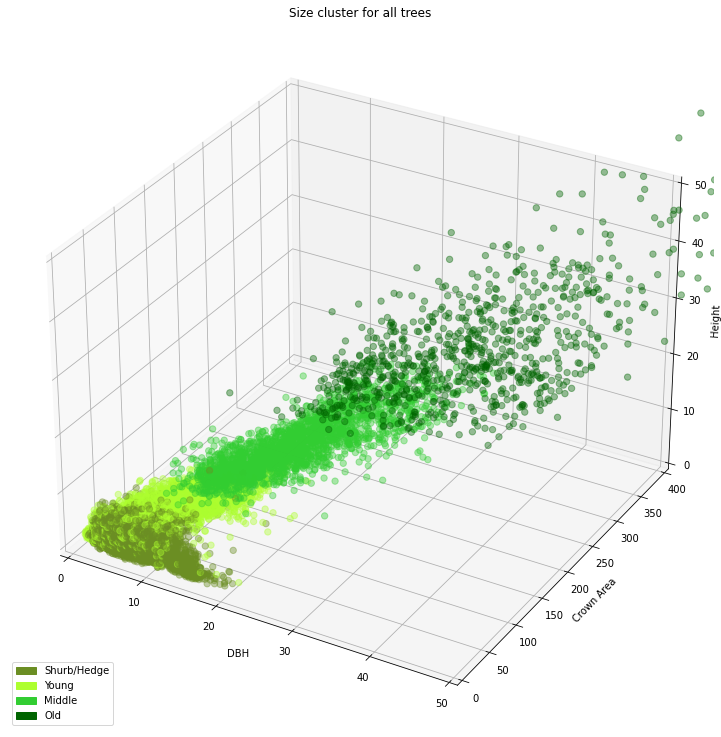

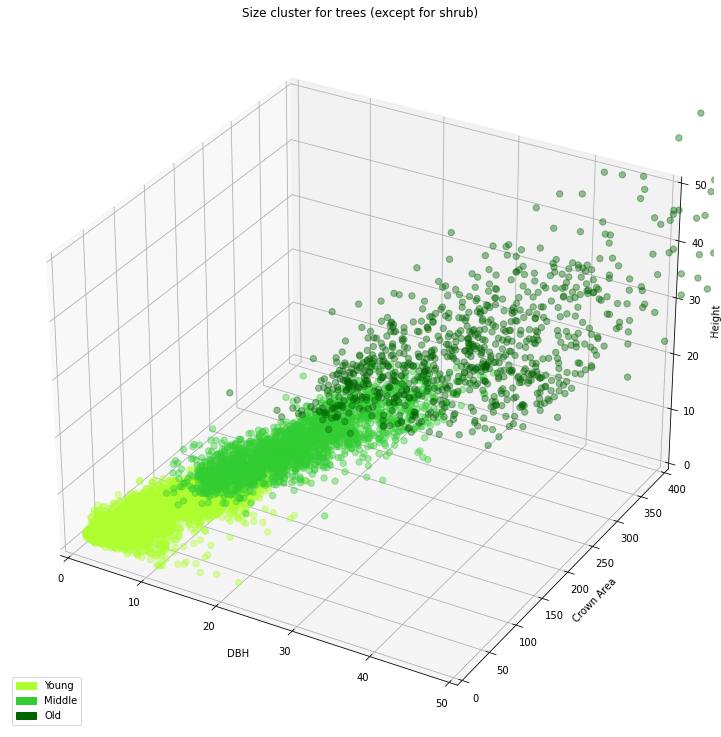

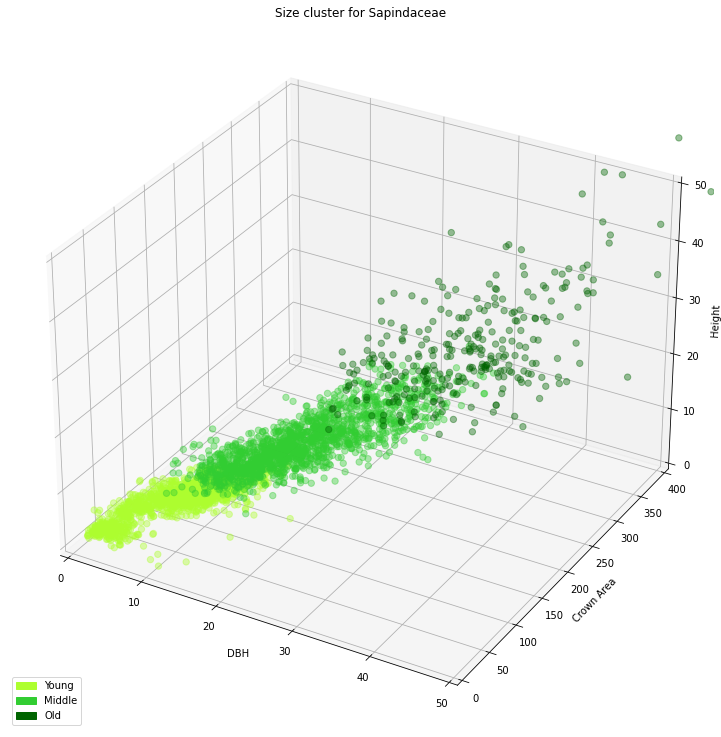

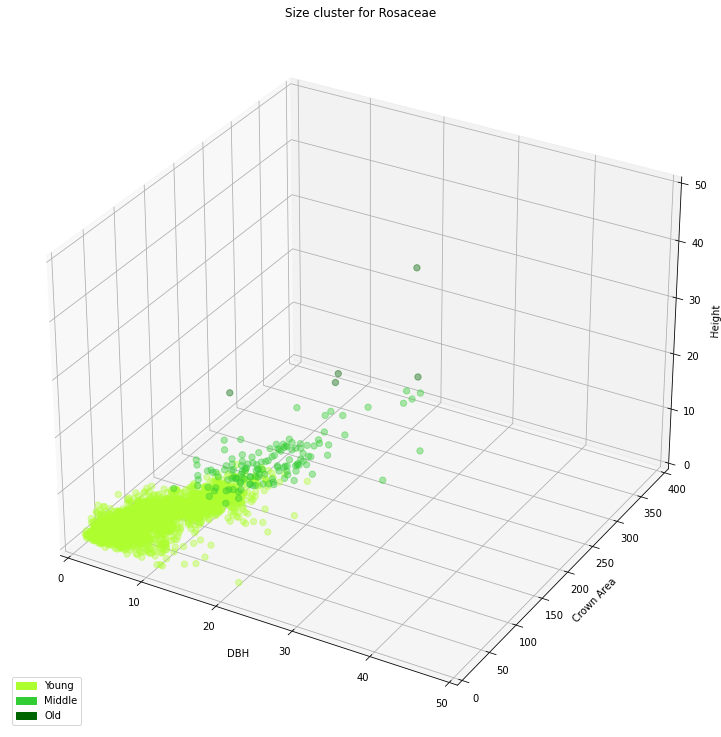

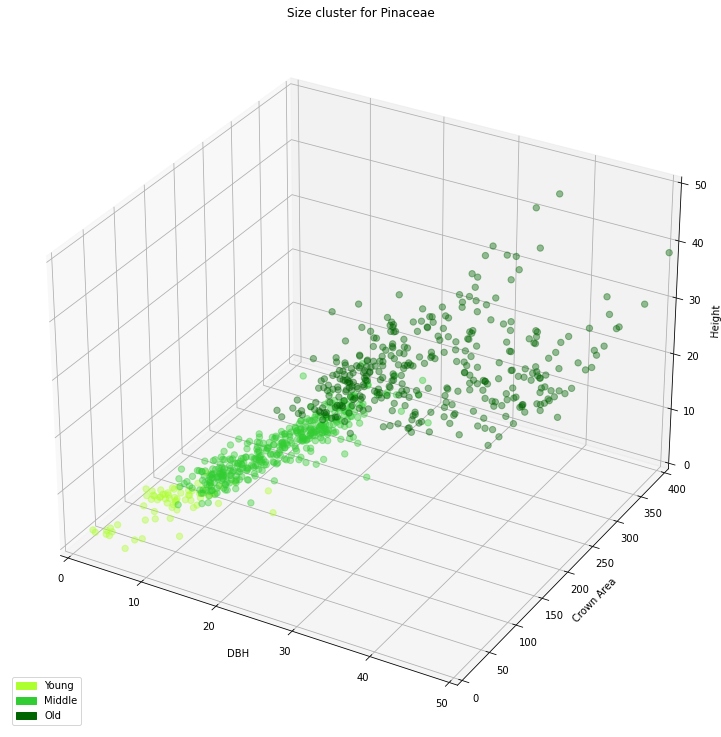

...

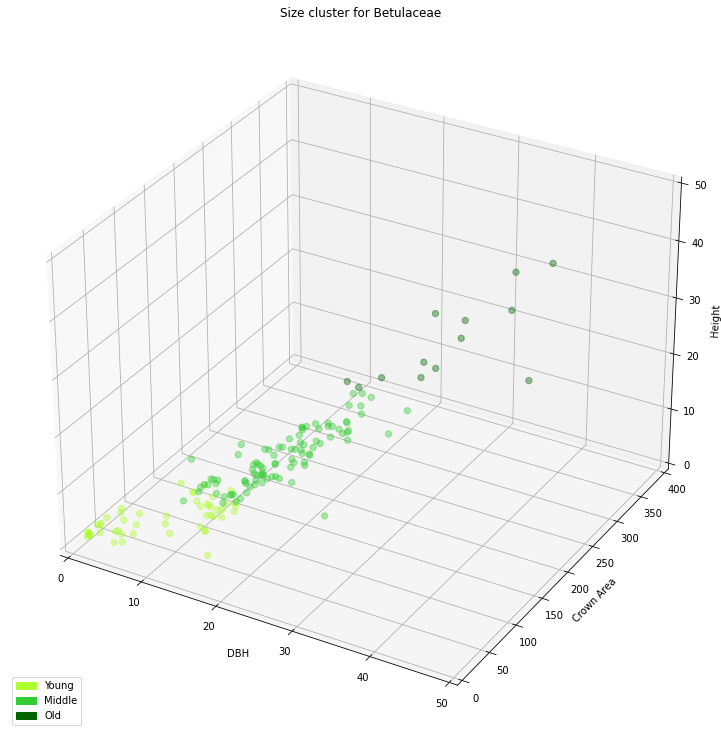

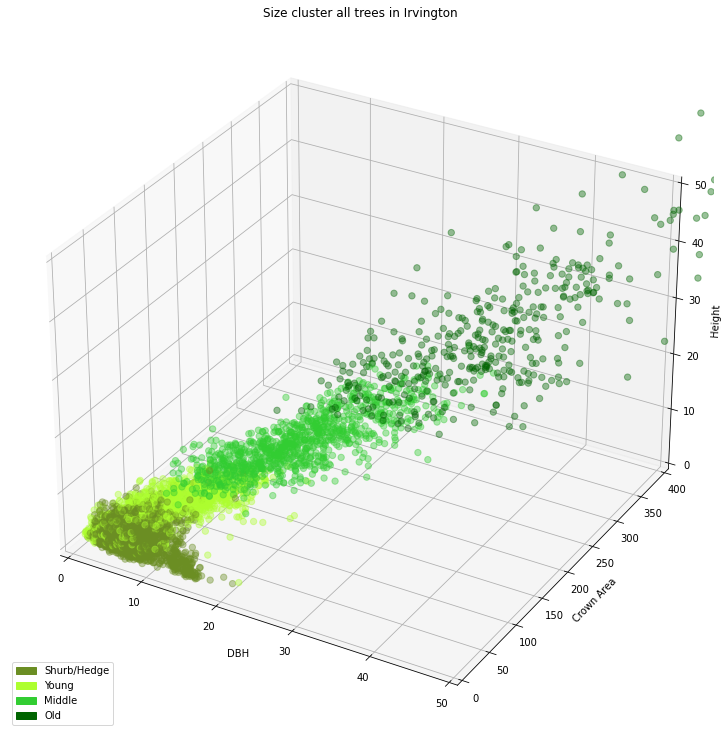

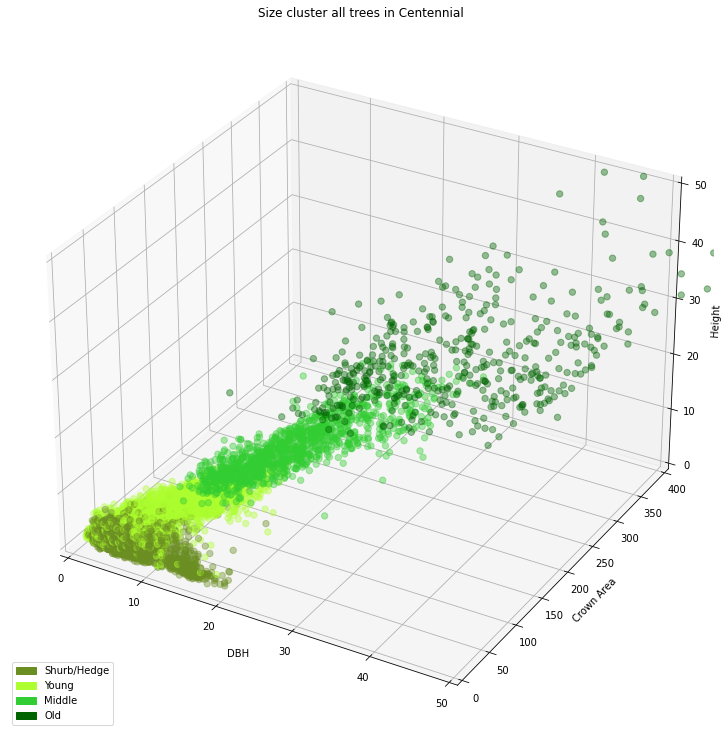

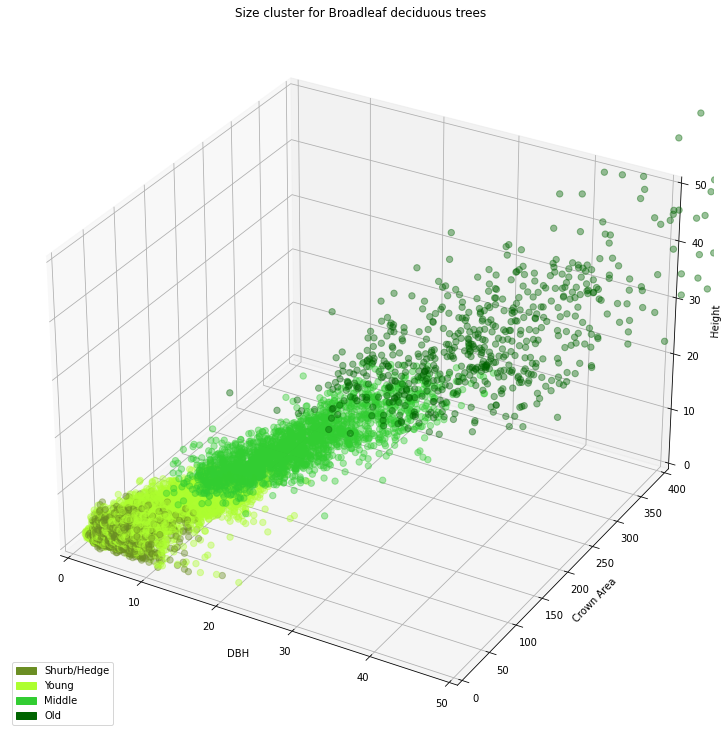

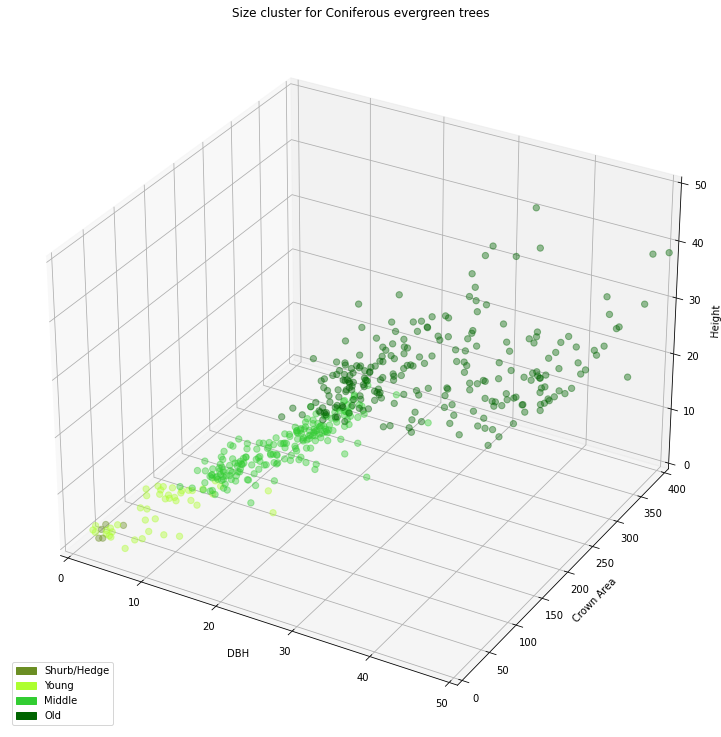

In [ ]:
plot_clustered_data4(df, "Size cluster for all trees")
plot_clustered_data3(df.loc[df['Family'] != 'HEDGE'], "Size cluster for trees (except for shrub)")
plot_clustered_data3(df.loc[df['Family'] == 'Sapindaceae'], "Size cluster for Sapindaceae")
plot_clustered_data3(df.loc[df['Family'] == 'Rosaceae'], "Size cluster for Rosaceae")
plot_clustered_data3(df.loc[df['Family'] == 'Pinaceae'], "Size cluster for Pinaceae")
plot_clustered_data3(df.loc[df['Family'] == 'Cornaceae'], "Size cluster for Cornaceae")
plot_clustered_data3(df.loc[df['Family'] == 'Fagaceae'], "Size cluster for Fagaceae")
plot_clustered_data3(df.loc[df['Family'] == 'Betulaceae'], "Size cluster for Betulaceae")
plot_clustered_data4(df.loc[df['treeID'] < 20000], "Size cluster all trees in Irvington")
plot_clustered_data4(df.loc[df['treeID'] > 20000], "Size cluster all trees in Centennial")
plot_clustered_data4(df.loc[df['Functional'] == 'BD'], "Size cluster for Broadleaf deciduous trees")
plot_clustered_data4(df.loc[df['Functional'] == 'CE'], "Size cluster for Coniferous evergreen trees")

# Clustering hedge + 4

In [ ]:
## checked
# df
df = pd.read_csv('/content/drive/MyDrive/XihanYAO_GISDataShare/230318_Prediction.csv')
# export the dataframe to a CSV file

In [ ]:
dfHEDGE = df.loc[df['Family'] == 'HEDGE']
dfnonHEDGE = subset = df.loc[df['Family'] != 'HEDGE']

# Select the columns you want to use for clustering
subset = dfnonHEDGE[['height', 'crownArea', 'DBH']]

# Create a scaler object and fit it to the data
scaler = RobustScaler()
scaler.fit(subset)

# Transform the data using the scaler object
normalized_data = scaler.transform(subset)

# Increase the weight of the 'height' column by multiplying it by a factor
normalized_data[:,0] *= 2

# Perform k-means clustering with 3 clusters
kmeans = KMeans(n_clusters=4).fit(normalized_data)

# Add a new column to the original dataframe with the cluster labels
dfnonHEDGE['Cluster'] = kmeans.labels_
dfHEDGE['Cluster'] = 4

# Merge the two dataframes together
merged_df = pd.merge(dfHEDGE, dfnonHEDGE, how='outer')

# Sort the merged dataframe by values in the 'height' column
df = merged_df.sort_values('treeID')
df

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

<ipython-input-43-88443adffebc>:21: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-43-88443adffebc>:22: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,treeID,min_x,min_y,max_x,max_y,abv,all,min,max,avg,qav,std,ske,kur,hom,p10,p25,p50,p75,p90,b10,b20,b30,b40,b50,b60,b70,b80,b90,d00,d01,d02,cov_gap,dns_gap,height,crownArea,SArea,Min_Slope,Max_Slope,Avg_Slope,Z_Mean_FirstReturn,2018_R,2018_G,2018_B,2018_N,2020_R,2020_G,2020_B,2020_N,averageNDVI,1re,2re,3re,4re,FirstofManyre,LastofManyre,Lastre,NonFirstoverFirst,Intensity,Functional,Condition,Family,DBH,Cluster
0,10003,527030.45,5043911.64,527034.10,5043912.86,46,100,2.68,2.91,2.87,8.23,0.04,-2.96,12.22,2.68,2.85,2.86,2.88,2.89,2.90,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.02,0.46,0.00,0.00,0.52,0.54,2.41,2.60,15.54,0.45,5698.07,875.34,1.36,55.82,88.93,61.68,221.14,111.17,122.33,115.17,86.50,0.24,46.00,0.00,0.00,0.00,2.00,0.00,44.00,0.00,43164.14,HEDGE,Good,HEDGE,8.41,4
5633,10004,527245.03,5043901.88,527259.66,5043916.21,8679,11003,1.37,14.93,7.99,72.76,2.98,-0.23,2.19,1.37,3.69,5.82,8.25,10.30,11.78,0.04,0.15,0.22,0.33,0.49,0.65,0.81,0.94,0.99,0.14,0.22,0.42,0.17,0.21,11.35,139.17,1273.63,0.00,10000.00,1671.15,6.61,61.62,79.08,64.92,202.11,56.24,89.45,79.05,184.66,0.53,6025.00,2200.00,402.00,31.00,3071.00,1898.00,4852.00,0.44,33628.48,BD,Fair,Sapindaceae,18.35,1
5634,10005,527344.70,5043902.50,527362.07,5043917.74,8936,10874,1.44,16.93,8.16,78.78,3.48,0.25,2.26,1.44,3.47,5.50,8.00,10.26,13.43,0.05,0.20,0.28,0.46,0.61,0.78,0.84,0.93,0.98,0.19,0.22,0.39,0.15,0.18,14.41,168.25,1121.49,0.00,10000.00,1244.77,7.16,46.58,53.65,59.16,175.47,45.34,67.62,73.77,170.05,0.58,5606.00,2523.00,551.00,66.00,3375.00,2303.00,4534.00,0.56,35488.29,BD,Fair,Sapindaceae,16.09,3
5635,10006,527421.81,5043897.01,527442.54,5043917.74,12173,13477,1.38,20.67,14.60,230.76,4.20,-0.84,2.66,1.38,8.02,11.57,15.86,17.97,18.96,0.01,0.02,0.07,0.15,0.24,0.30,0.40,0.60,0.87,0.01,0.07,0.28,0.02,0.10,19.27,297.94,1331.66,0.14,10000.00,1511.67,13.89,45.64,68.58,58.75,209.19,44.47,83.14,73.68,189.25,0.63,8062.00,3145.00,656.00,77.00,3883.00,2540.00,6719.00,0.48,37336.65,BD,Fair,Fagaceae,32.17,3
5636,10007,527151.76,5043901.58,527167.30,5043914.69,4660,5729,1.38,11.57,7.80,64.71,1.97,-0.93,3.61,1.38,5.22,6.57,8.28,9.28,9.92,0.02,0.04,0.06,0.11,0.24,0.38,0.55,0.81,0.98,0.06,0.29,0.45,0.15,0.19,9.69,97.46,700.19,0.00,10000.00,1402.57,5.97,57.55,72.19,67.12,201.59,53.13,81.30,77.64,187.81,0.56,3822.00,726.00,97.00,4.00,1154.00,630.00,3298.00,0.22,36624.30,BD,Fair,Sapindaceae,15.50,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12907,27621,538367.08,5039095.60,538371.66,5039103.22,513,917,1.42,22.70,9.54,141.68,7.13,0.43,1.78,1.42,1.75,2.17,8.91,14.85,20.50,0.31,0.43,0.47,0.53,0.72,0.74,0.76,0.79,0.92,0.13,0.03,0.15,0.40,0.44,7.66,13.56,246.34,0.07,10000.00,3906.60,6.81,136.60,147.34,135.88,210.39,113.46,134.63,114.78,188.78,0.23,417.00,83.00,8.00,1.00,305.00,33.00,145.00,0.22,30989.68,BD,Good,Cornaceae,9.77,2
12908,27623,538339.96,5039094.69,538346.36,5039100.17,308,862,1.48,21.27,9.28,109.77,4.88,0.58,3.01,1.48,3.33,5.56,9.14,11.84,17.50,0.10,0.24,0.40,0.51,0.54,0.90,0.90,0.90,0.95,0.05,0.07,0.17,0.57,0.64,5.93,16.17,277.07,0.12,10000.00,3781.20,5.10,165.63,160.12,158.66,192.75,141.14,147.91,131.79,173.26,0.09,262.00,41.00,5.00,0.00,247.00,10.00,25.00,0.18,29726.94,BD,Good,Cornaceae,11.77,2
12909,27625,538308.26,5039093.77,538311.61,5039097.12,137,389,2.09,20.93,9.58,112.64,4.59,0.14,3.27,2.09,2.54,6.77,11.29,11.49,11.60,0.20,0.22,0.26,0.34,0.43,0.93,0.93,0.93,0.96,0.08,0.02,0.23,0.61,0.65,4.13,6.22,91.12,0.20,8227.38,2632.09,4.00,175.43,169.66,168.01,189.06,176.60,175.90,162.10,144.40,-0.03,126.00,9.00,2.00,0.00,116.00,1.00,11.00,0.09,30093.06,BD,Good,Rosaceae,9.22,2
12910,27627,538247.30,5039092.86,538252.48,5039096.21,322,654,1.47,19.59,7.68,86.12,5.21,0.34,2.18,1.47,1.81,2.02,9.07,11.32,11.53,0.38,0.41,0.45,0.48,0.55,0.92,0.92,0.93,0.95,0.08,0.03,0.22,0.4

In [ ]:
# Filter out the extreme value outliers
df1 = df[(df['DBH'] >= df['DBH'].quantile(0.01)) & (df['DBH'] <= df['DBH'].quantile(0.99))]
df1 = df1[(df1['crownArea'] >= df1['crownArea'].quantile(0.01)) & (df1['crownArea'] <= df1['crownArea'].quantile(0.99))]
df1 = df1[(df1['height'] >= df1['height'].quantile(0.01)) & (df1['height'] <= df1['height'].quantile(0.99))]

# Create an interactive 3D scatter plot with the cluster labels represented by color
fig = px.scatter_3d(df1, x='DBH', y='crownArea', z='height', color='Cluster',)
fig.show()

In [ ]:
# after each random model was generated, use this line of code to assign 0 to shrub, 1 to small, 2 to middle and 3 to old
df['Cluster'] = df['Cluster'].replace({0:4, 1:2, 2:1,3:3, 4:0})

In [ ]:
# Filter out the extreme value outliers
df1 = df[(df['DBH'] >= df['DBH'].quantile(0.01)) & (df['DBH'] <= df['DBH'].quantile(0.99))]
df1 = df1[(df1['crownArea'] >= df1['crownArea'].quantile(0.01)) & (df1['crownArea'] <= df1['crownArea'].quantile(0.99))]
df1 = df1[(df1['height'] >= df1['height'].quantile(0.01)) & (df1['height'] <= df1['height'].quantile(0.99))]

# Create an interactive 3D scatter plot with the cluster labels represented by color
fig = px.scatter_3d(df1, x='DBH', y='crownArea', z='height', color='Cluster',)
fig.show()

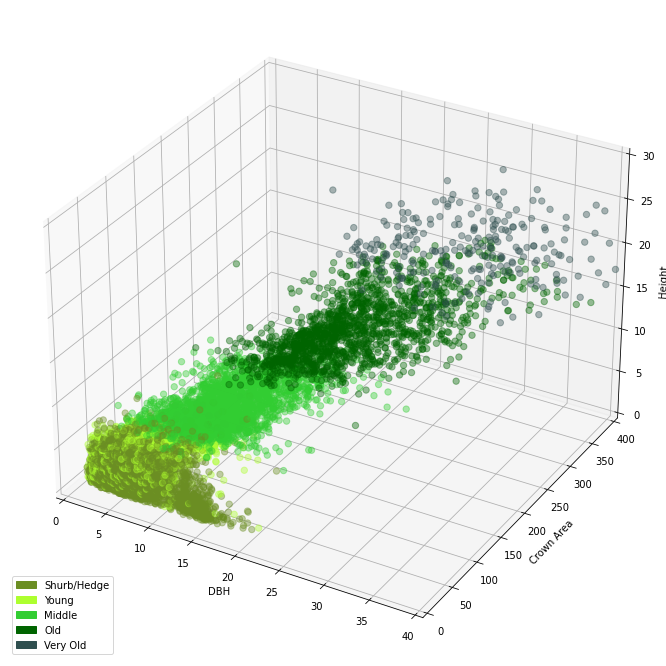

In [ ]:


# Define the colormap for the clusters
cluster_colors = ListedColormap(['olivedrab', 'greenyellow', 'limegreen', 'darkgreen',"darkslategray"])



# Define the mapping from cluster labels to names
cluster_names = {0: 'Shurb/Hedge', 1: 'Young', 2: 'Middle', 3: 'Old', 4:"Very Old"}

# Create a 3D scatter plot with the cluster labels represented by color
fig = plt.figure(figsize=(15, 12))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(df1['DBH'], df1['crownArea'], df1['height'], c=df1['Cluster'], s=40, alpha=0.4, cmap=cluster_colors)

# Add axis labels
ax.set_xlabel('DBH')
ax.set_ylabel('Crown Area')
ax.set_zlabel('Height')

# Create custom legend handles and labels
handles = []
labels = []
for i in range(5):
    handles.append(mpatches.Patch(color=cluster_colors(i), label=cluster_names[i]))
    labels.append(cluster_names[i])

# Add a color bar with the cluster labels
ax.legend(handles=handles, labels=labels, title='', loc='lower left')

# Set the limits of the x, y, and z axes
ax.set_xlim(0, 40)
ax.set_ylim(0, 400)
ax.set_zlim(0, 30)

plt.show()


In [ ]:
def plot_clustered_data4(df,title):
    # Define the colormap for the clusters
    cluster_colors = ListedColormap(['olivedrab', 'greenyellow', 'limegreen', 'darkgreen', 'darkslategray'])

    # Define the mapping from cluster labels to names
    cluster_names = {0: 'Shurb/Hedge', 1: 'Young', 2: 'Middle', 3: 'Old', 4:"Very Old"}

    # Create a 3D scatter plot with the cluster labels represented by color
    fig = plt.figure(figsize=(13, 13))
    ax = fig.add_subplot(111, projection='3d')
    scatter = ax.scatter(df['DBH'], df['crownArea'], df['height'], c=df['Cluster'], s=40, alpha=0.4, cmap=cluster_colors)

    # Add axis labels
    ax.set_xlabel('DBH')
    ax.set_ylabel('Crown Area')
    ax.set_zlabel('Height')

    # Create custom legend handles and labels
    handles = []
    labels = []
    for i in range(5):
        handles.append(mpatches.Patch(color=cluster_colors(i), label=cluster_names[i]))
        labels.append(cluster_names[i])

    # Add a color bar with the cluster labels
    ax.legend(handles=handles, labels=labels, title='', loc='lower left')

    # Set the limits of the x, y, and z axes
    ax.set_xlim(0, 50)
    ax.set_ylim(0, 400)
    ax.set_zlim(0, 50)
    # Add a title to the plot
    ax.set_title(title)

    plt.show()

In [ ]:
def plot_clustered_data3(df,title):
    # Define the colormap for the clusters
    cluster_colors = ListedColormap(['greenyellow', 'limegreen', 'darkgreen','darkslategray'])

    # Define the mapping from cluster labels to names
    cluster_names = { 0: 'Young', 1: 'Middle', 2: 'Old',3: "Very Old"}

    # Create a 3D scatter plot with the cluster labels represented by color
    fig = plt.figure(figsize=(13, 13))
    ax = fig.add_subplot(111, projection='3d')
    scatter = ax.scatter(df['DBH'], df['crownArea'], df['height'], c=df['Cluster'], s=40, alpha=0.4, cmap=cluster_colors)

    # Add axis labels
    ax.set_xlabel('DBH')
    ax.set_ylabel('Crown Area')
    ax.set_zlabel('Height')

    # Create custom legend handles and labels
    handles = []
    labels = []
    for i in range(4):
        handles.append(mpatches.Patch(color=cluster_colors(i), label=cluster_names[i]))
        labels.append(cluster_names[i])

    # Add a color bar with the cluster labels
    ax.legend(handles=handles, labels=labels, title='', loc='lower left')

    # Set the limits of the x, y, and z axes
    ax.set_xlim(0, 50)
    ax.set_ylim(0, 400)
    ax.set_zlim(0, 50)

    # Add a title to the plot
    ax.set_title(title)

    plt.show()

In [ ]:
def plot_clustered_data1(df,title):
    # Define the colormap for the clusters
    cluster_colors = ListedColormap(['greenyellow', 'limegreen'])

    # Define the mapping from cluster labels to names
    cluster_names = { 0: 'Young', 1: 'Middle'}

    # Create a 3D scatter plot with the cluster labels represented by color
    fig = plt.figure(figsize=(13, 13))
    ax = fig.add_subplot(111, projection='3d')
    scatter = ax.scatter(df['DBH'], df['crownArea'], df['height'], c=df['Cluster'], s=40, alpha=0.4, cmap=cluster_colors)

    # Add axis labels
    ax.set_xlabel('DBH')
    ax.set_ylabel('Crown Area')
    ax.set_zlabel('Height')

    # Create custom legend handles and labels
    handles = []
    labels = []
    for i in range(2):
        handles.append(mpatches.Patch(color=cluster_colors(i), label=cluster_names[i]))
        labels.append(cluster_names[i])

    # Add a color bar with the cluster labels
    ax.legend(handles=handles, labels=labels, title='', loc='lower left')

    # Set the limits of the x, y, and z axes
    ax.set_xlim(0, 50)
    ax.set_ylim(0, 400)
    ax.set_zlim(0, 50)

    # Add a title to the plot
    ax.set_title(title)

    plt.show()

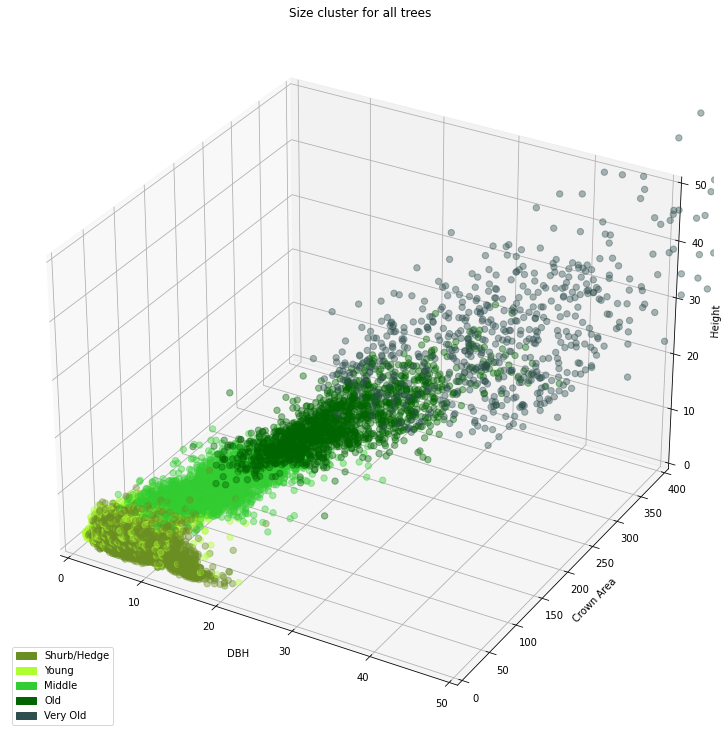

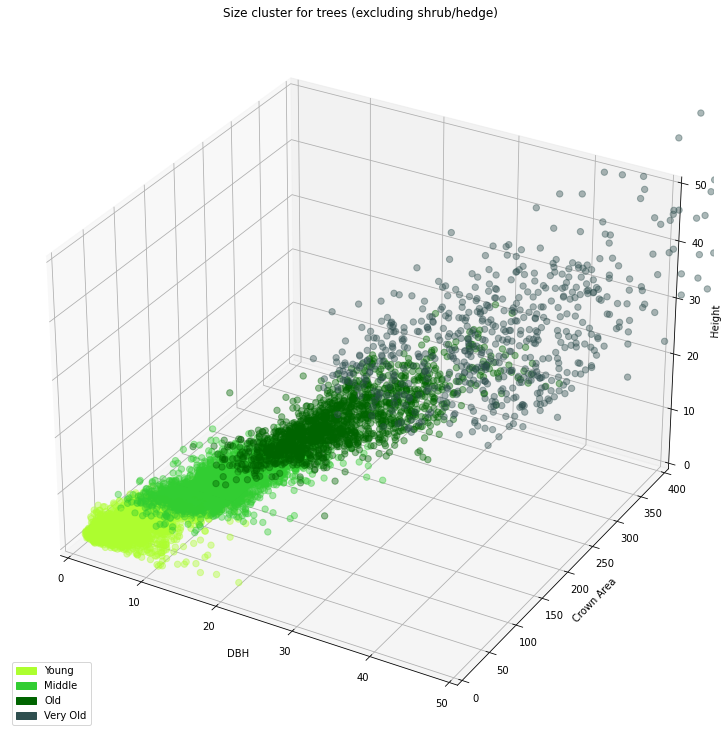

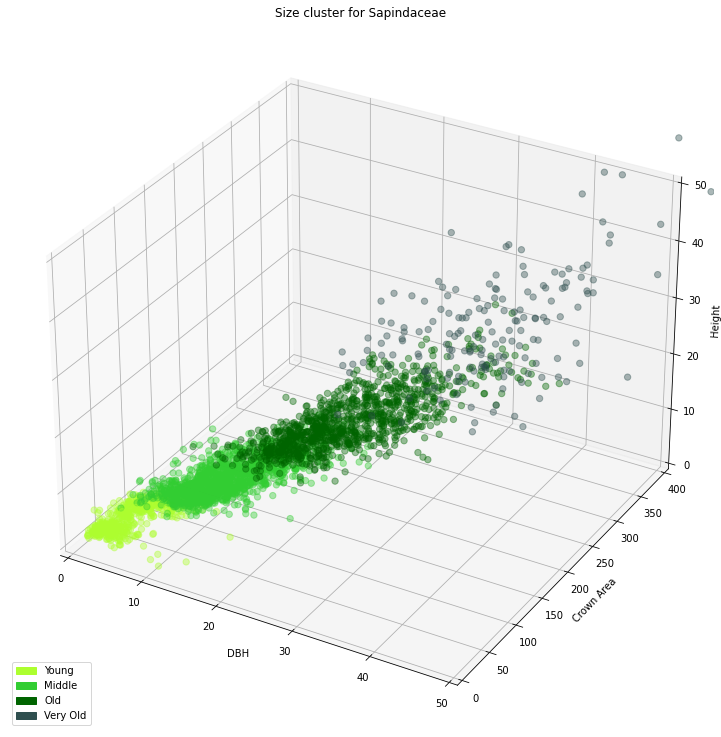

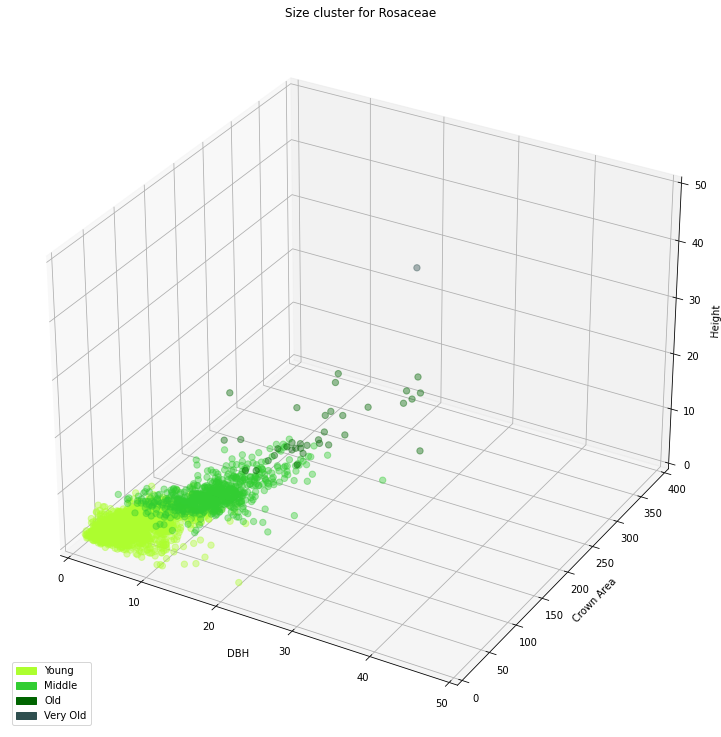

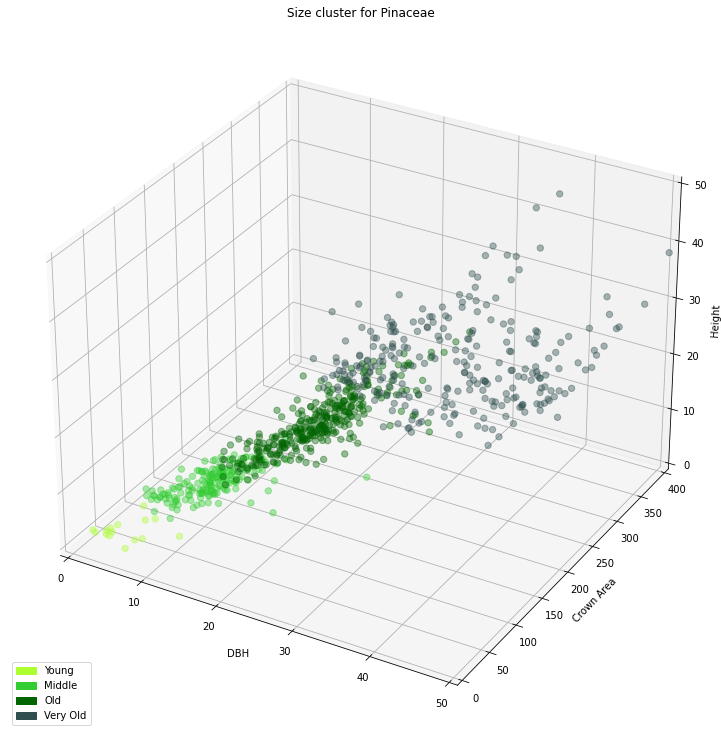

...

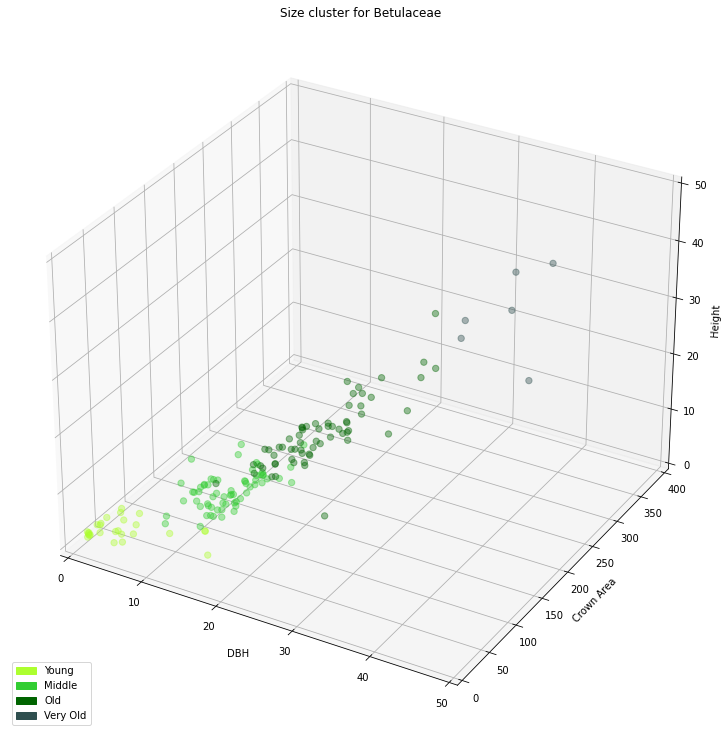

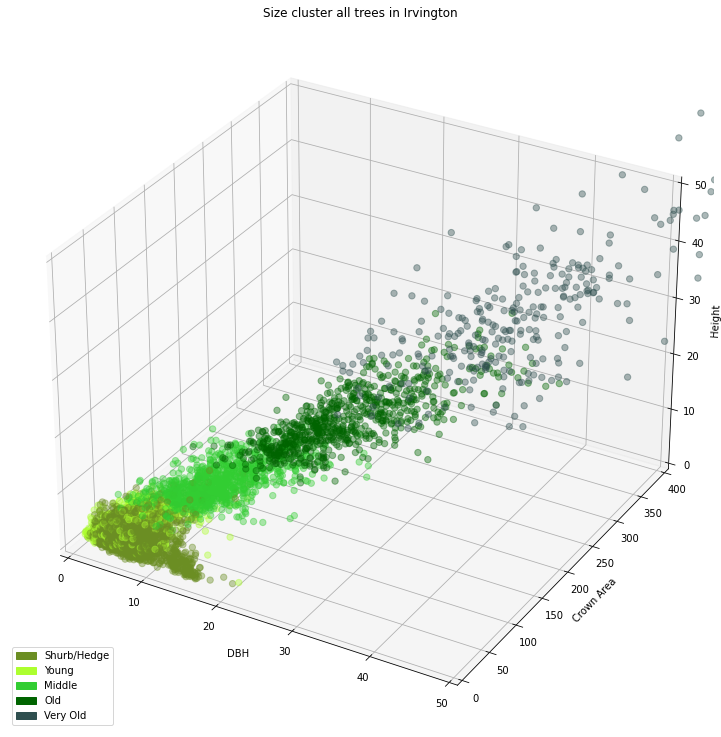

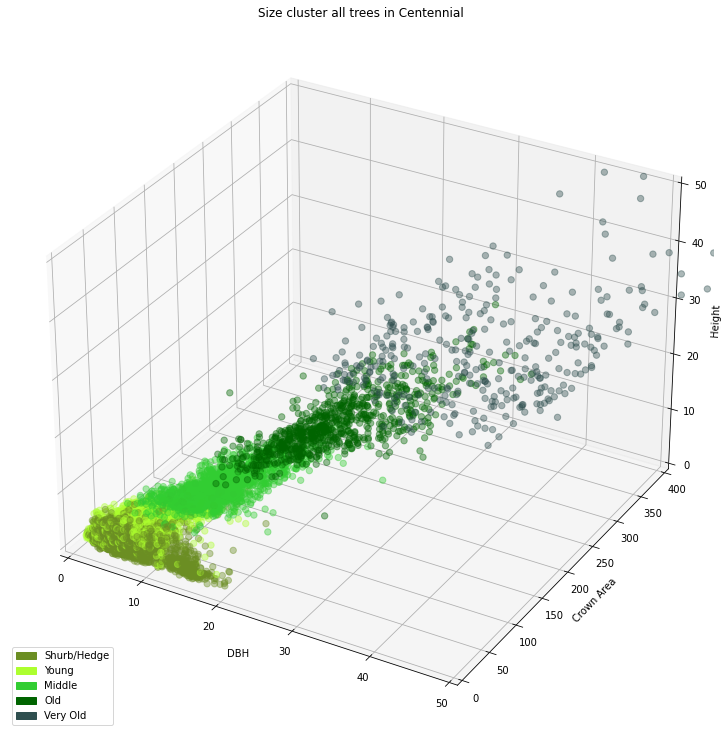

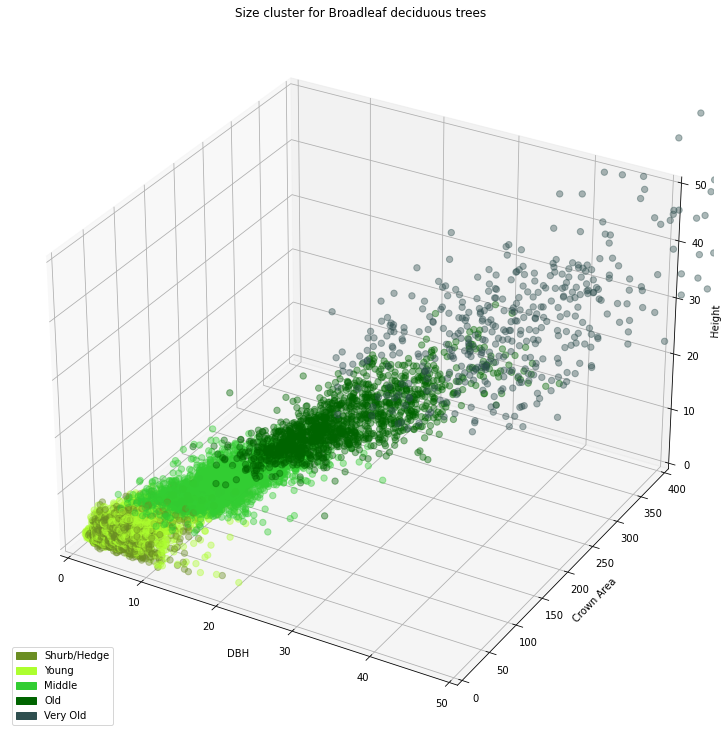

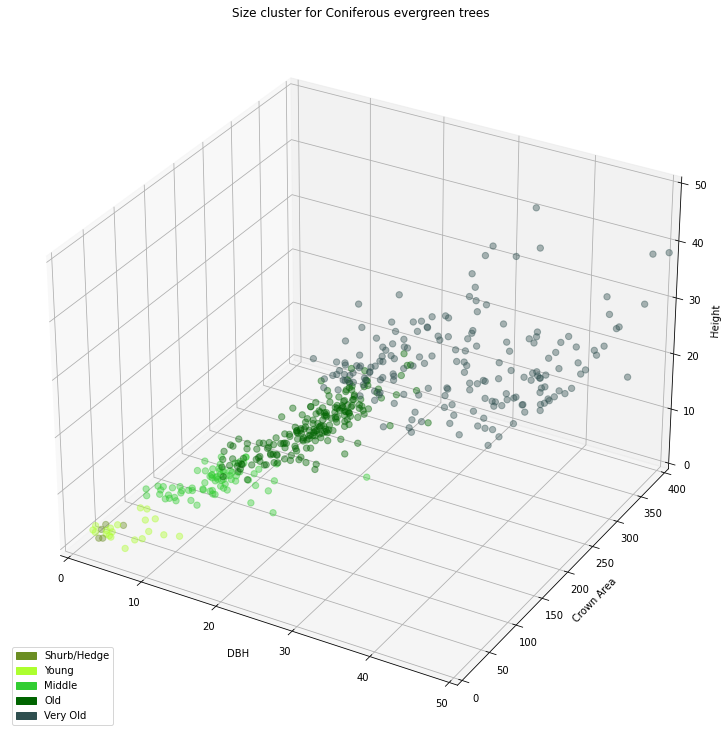

In [ ]:
plot_clustered_data4(df, "Size cluster for all trees")
plot_clustered_data3(df.loc[df['Family'] != 'HEDGE'], "Size cluster for trees (excluding shrub/hedge)")
plot_clustered_data3(df.loc[df['Family'] == 'Sapindaceae'], "Size cluster for Sapindaceae")
plot_clustered_data3(df.loc[df['Family'] == 'Rosaceae'], "Size cluster for Rosaceae")
plot_clustered_data3(df.loc[df['Family'] == 'Pinaceae'], "Size cluster for Pinaceae")
plot_clustered_data1(df.loc[df['Family'] == 'Cornaceae'], "Size cluster for Cornaceae")
plot_clustered_data3(df.loc[df['Family'] == 'Fagaceae'], "Size cluster for Fagaceae")
plot_clustered_data3(df.loc[df['Family'] == 'Betulaceae'], "Size cluster for Betulaceae")
plot_clustered_data4(df.loc[df['treeID'] < 20000], "Size cluster all trees in Irvington")
plot_clustered_data4(df.loc[df['treeID'] > 20000], "Size cluster all trees in Centennial")
plot_clustered_data4(df.loc[df['Functional'] == 'BD'], "Size cluster for Broadleaf deciduous trees")
plot_clustered_data4(df.loc[df['Functional'] == 'CE'], "Size cluster for Coniferous evergreen trees")

# E W Seperation and exporting

In [ ]:
df

,treeID,min_x,min_y,max_x,max_y,abv,all,min,max,avg,qav,std,ske,kur,hom,p10,p25,p50,p75,p90,b10,b20,b30,b40,b50,b60,b70,b80,b90,d00,d01,d02,cov_gap,dns_gap,height,crownArea,SArea,Min_Slope,Max_Slope,Avg_Slope,Z_Mean_FirstReturn,2018_R,2018_G,2018_B,2018_N,2020_R,2020_G,2020_B,2020_N,averageNDVI,1re,2re,3re,4re,FirstofManyre,LastofManyre,Lastre,NonFirstoverFirst,Intensity,Functional,Condition,Family,DBH,Cluster
0,10003,527030.45,5043911.64,527034.10,5043912.86,46,100,2.68,2.91,2.87,8.23,0.04,-2.96,12.22,2.68,2.85,2.86,2.88,2.89,2.90,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.02,0.46,0.00,0.00,0.52,0.54,2.41,2.60,15.54,0.45,5698.07,875.34,1.36,55.82,88.93,61.68,221.14,111.17,122.33,115.17,86.50,0.24,46.00,0.00,0.00,0.00,2.00,0.00,44.00,0.00,43164.14,HEDGE,Good,HEDGE,8.41,0
5633,10004,527245.03,5043901.88,527259.66,5043916.21,8679,11003,1.37,14.93,7.99,72.76,2.98,-0.23,2.19,1.37,3.69,5.82,8.25,10.30,11.78,0.04,0.15,0.22,0.33,0.49,0.65,0.81,0.94,0.99,0.14,0.22,0.42,0.17,0.21,11.35,139.17,1273.63,0.00,10000.00,1671.15,6.61,61.62,79.08,64.92,202.11,56.24,89.45,79.05,184.66,0.53,6025.00,2200.00,402.00,31.00,3071.00,1898.00,4852.00,0.44,33628.48,BD,Fair,Sapindaceae,18.35,2
5634,10005,527344.70,5043902.50,527362.07,5043917.74,8936,10874,1.44,16.93,8.16,78.78,3.48,0.25,2.26,1.44,3.47,5.50,8.00,10.26,13.43,0.05,0.20,0.28,0.46,0.61,0.78,0.84,0.93,0.98,0.19,0.22,0.39,0.15,0.18,14.41,168.25,1121.49,0.00,10000.00,1244.77,7.16,46.58,53.65,59.16,175.47,45.34,67.62,73.77,170.05,0.58,5606.00,2523.00,551.00,66.00,3375.00,2303.00,4534.00,0.56,35488.29,BD,Fair,Sapindaceae,16.09,3
5635,10006,527421.81,5043897.01,527442.54,5043917.74,12173,13477,1.38,20.67,14.60,230.76,4.20,-0.84,2.66,1.38,8.02,11.57,15.86,17.97,18.96,0.01,0.02,0.07,0.15,0.24,0.30,0.40,0.60,0.87,0.01,0.07,0.28,0.02,0.10,19.27,297.94,1331.66,0.14,10000.00,1511.67,13.89,45.64,68.58,58.75,209.19,44.47,83.14,73.68,189.25,0.63,8062.00,3145.00,656.00,77.00,3883.00,2540.00,6719.00,0.48,37336.65,BD,Fair,Fagaceae,32.17,3
5636,10007,527151.76,5043901.58,527167.30,5043914.69,4660,5729,1.38,11.57,7.80,64.71,1.97,-0.93,3.61,1.38,5.22,6.57,8.28,9.28,9.92,0.02,0.04,0.06,0.11,0.24,0.38,0.55,0.81,0.98,0.06,0.29,0.45,0.15,0.19,9.69,97.46,700.19,0.00,10000.00,1402.57,5.97,57.55,72.19,67.12,201.59,53.13,81.30,77.64,187.81,0.56,3822.00,726.00,97.00,4.00,1154.00,630.00,3298.00,0.22,36624.30,BD,Fair,Sapindaceae,15.50,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12907,27621,538367.08,5039095.60,538371.66,5039103.22,513,917,1.42,22.70,9.54,141.68,7.13,0.43,1.78,1.42,1.75,2.17,8.91,14.85,20.50,0.31,0.43,0.47,0.53,0.72,0.74,0.76,0.79,0.92,0.13,0.03,0.15,0.40,0.44,7.66,13.56,246.34,0.07,10000.00,3906.60,6.81,136.60,147.34,135.88,210.39,113.46,134.63,114.78,188.78,0.23,417.00,83.00,8.00,1.00,305.00,33.00,145.00,0.22,30989.68,BD,Good,Cornaceae,9.77,1
12908,27623,538339.96,5039094.69,538346.36,5039100.17,308,862,1.48,21.27,9.28,109.77,4.88,0.58,3.01,1.48,3.33,5.56,9.14,11.84,17.50,0.10,0.24,0.40,0.51,0.54,0.90,0.90,0.90,0.95,0.05,0.07,0.17,0.57,0.64,5.93,16.17,277.07,0.12,10000.00,3781.20,5.10,165.63,160.12,158.66,192.75,141.14,147.91,131.79,173.26,0.09,262.00,41.00,5.00,0.00,247.00,10.00,25.00,0.18,29726.94,BD,Good,Cornaceae,11.77,1
12909,27625,538308.26,5039093.77,538311.61,5039097.12,137,389,2.09,20.93,9.58,112.64,4.59,0.14,3.27,2.09,2.54,6.77,11.29,11.49,11.60,0.20,0.22,0.26,0.34,0.43,0.93,0.93,0.93,0.96,0.08,0.02,0.23,0.61,0.65,4.13,6.22,91.12,0.20,8227.38,2632.09,4.00,175.43,169.66,168.01,189.06,176.60,175.90,162.10,144.40,-0.03,126.00,9.00,2.00,0.00,116.00,1.00,11.00,0.09,30093.06,BD,Good,Rosaceae,9.22,1
12910,27627,538247.30,5039092.86,538252.48,5039096.21,322,654,1.47,19.59,7.68,86.12,5.21,0.34,2.18,1.47,1.81,2.02,9.07,11.32,11.53,0.38,0.41,0.45,0.48,0.55,0.92,0.92,0.93,0.95,0.08,0.03,0.22,0.4

In [ ]:
dfW = df.loc[df['treeID'] < 20000]
dfW['treeID'] = dfW['treeID']-10000
dfW =dfW[['treeID', 'Functional','Condition', 'Family','DBH','height','crownArea','Cluster']]

# define a function to map the values
def map_size(val):
    if val == 1:
        return 'Young'
    elif val == 2:
        return 'Middle'
    elif val == 3:
        return 'Old'
    elif val == 4:
        return 'Very Old'
    else:
        return 'Hedge'

# use the function to create the new column
dfW['size_category'] = dfW['Cluster'].apply(map_size)

# print the result
print(dfW)
# Export the DataFrame to a CSV file
dfW.to_csv('/content/drive/MyDrive/XihanYAO_GISDataShare/230319WestResults.csv', index=False)
dfW

      treeID Functional Condition       Family   DBH  height  crownArea  \
0          3      HEDGE      Good        HEDGE  8.41    2.41       2.60   
5633       4         BD      Fair  Sapindaceae 18.35   11.35     139.17   
5634       5         BD      Fair  Sapindaceae 16.09   14.41     168.25   
5635       6         BD      Fair     Fagaceae 32.17   19.27     297.94   
5636       7         BD      Fair  Sapindaceae 15.50    9.69      97.46   
...      ...        ...       ...          ...   ...     ...        ...   
8543    5547         BD      Fair  Sapindaceae 18.73   13.14     123.84   
8544    5548         BD      Fair     Rosaceae  7.73    8.08      22.20   
8545    5549         BD      Fair     Rosaceae  8.39    7.63      17.74   
8546    5551         BD      Fair     Rosaceae 12.31   10.03     110.55   
2555    5554      HEDGE      Good        HEDGE 11.27    9.85       2.51   

      Cluster size_category  
0           0         Hedge  
5633        2        Middle  
5634     

<ipython-input-60-a51f88535324>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,treeID,Functional,Condition,Family,DBH,height,crownArea,Cluster,size_category
0,3,HEDGE,Good,HEDGE,8.41,2.41,2.60,0,Hedge
5633,4,BD,Fair,Sapindaceae,18.35,11.35,139.17,2,Middle
5634,5,BD,Fair,Sapindaceae,16.09,14.41,168.25,3,Old
5635,6,BD,Fair,Fagaceae,32.17,19.27,297.94,3,Old
5636,7,BD,Fair,Sapindaceae,15.50,9.69,97.46,2,Middle
...,...,...,...,...,...,...,...,...,...
8543,5547,BD,Fair,Sapindaceae,18.73,13.14,123.84,3,Old
8544,5548,BD,Fair,Rosaceae,7.73,8.08,22.20,1,Young
8545,5549,BD,Fair,Rosaceae,8.39,7.63,17.74,1,Young
8546,5551,BD,Fair,Rosaceae,12.31,10.03,110.55,2,Middle


In [ ]:
dfE = df.loc[df['treeID'] > 20000]
dfE['treeID'] = dfE['treeID']-20000
dfE =dfE[['treeID', 'Functional','Condition', 'Family','DBH','height','crownArea','Cluster']]

# use the function to create the new column
dfE['size_category'] = dfE['Cluster'].apply(map_size)

dfE.to_csv('/content/drive/MyDrive/XihanYAO_GISDataShare/230319EastResults.csv', index=False)
dfE

<ipython-input-61-cdf7ae7cfb46>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,treeID,Functional,Condition,Family,DBH,height,crownArea,Cluster,size_category
8547,6,BD,Fair,Rosaceae,9.57,6.73,50.73,1,Young
8548,7,BD,Good,Rosaceae,3.55,3.61,3.25,1,Young
8549,8,BD,Good,Cornaceae,10.96,4.72,7.71,1,Young
8550,9,BD,Poor,Rosaceae,3.44,3.56,9.85,1,Young
8551,10,BD,Fair,Rosaceae,3.17,3.37,10.68,1,Young
...,...,...,...,...,...,...,...,...,...
12907,7621,BD,Good,Cornaceae,9.77,7.66,13.56,1,Young
12908,7623,BD,Good,Cornaceae,11.77,5.93,16.17,1,Young
12909,7625,BD,Good,Rosaceae,9.22,4.13,6.22,1,Young
12910,7627,BD,Good,Rosaceae,8.28,6.09,9.94,1,Young


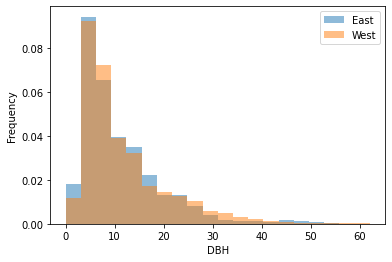

In [ ]:
column_name = 'DBH'
max_value = max(dfW[column_name].max(), dfE[column_name].max())

# plot histograms of a column from each DataFrame on the same plot
plt.hist(dfE[column_name], alpha=0.5, label='East', bins=20, range=(0,max_value),density=True)
plt.hist(dfW[column_name], alpha=0.5, label='West', bins=20, range=(0,max_value),density=True)
plt.xlabel('DBH')
plt.ylabel('Frequency')
plt.legend(loc='upper right')
plt.show()

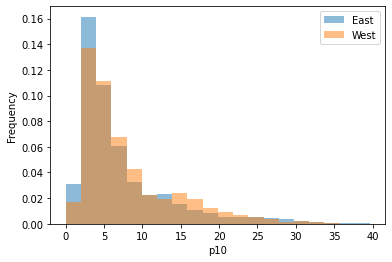

In [ ]:
column_name = 'height'
max_value = max(dfW[column_name].max(), dfE[column_name].max())

# plot histograms of a column from each DataFrame on the same plot
plt.hist(dfE[column_name], alpha=0.5, label='East', bins=20, range=(0,max_value),density=True)
plt.hist(dfW[column_name], alpha=0.5, label='West', bins=20, range=(0,max_value),density=True)
plt.xlabel('p10')
plt.ylabel('Frequency')
plt.legend(loc='upper right')
plt.show()

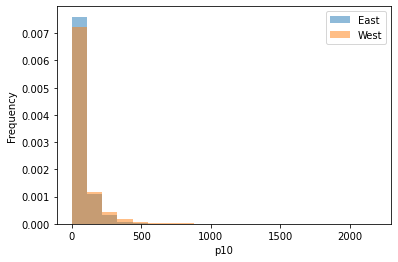

In [ ]:
column_name = 'crownArea'
max_value = max(dfW[column_name].max(), dfE[column_name].max())

# plot histograms of a column from each DataFrame on the same plot
plt.hist(dfE[column_name], alpha=0.5, label='East', bins=20, range=(0,max_value),density=True)
plt.hist(dfW[column_name], alpha=0.5, label='West', bins=20, range=(0,max_value),density=True)
plt.xlabel('p10')
plt.ylabel('Frequency')
plt.legend(loc='upper right')
plt.show()

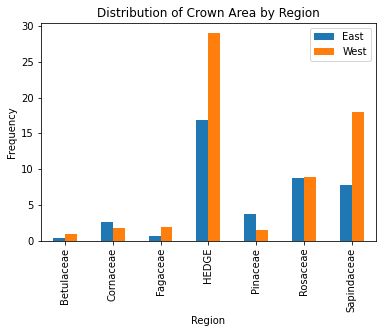

In [ ]:
# Get the count of each region in each DataFrame
east_counts = dfE['Family'].value_counts()/182.20
west_counts = dfW['Family'].value_counts()/88.23

# Create a new DataFrame with the counts for each region
data = pd.DataFrame({'East': east_counts, 'West': west_counts})

# Plot the bar chart
data.plot(kind='bar')
plt.xlabel('Region')
plt.ylabel('Frequency')
plt.title('Distribution of Crown Area by Region')
plt.show()

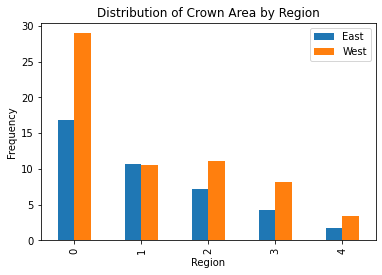

In [ ]:
# Get the count of each region in each DataFrame
east_counts = dfE['Cluster'].value_counts()/182.20
west_counts = dfW['Cluster'].value_counts()/88.23

# Create a new DataFrame with the counts for each region
data = pd.DataFrame({'East': east_counts, 'West': west_counts})

# Plot the bar chart
data.plot(kind='bar')
plt.xlabel('Region')
plt.ylabel('Frequency')
plt.title('Distribution of Crown Area by Region')
plt.show()

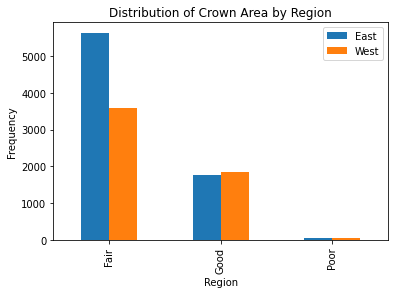

In [ ]:
# Get the count of each region in each DataFrame
east_counts = dfE['Condition'].value_counts()
west_counts = dfW['Condition'].value_counts()

# Create a new DataFrame with the counts for each region
data = pd.DataFrame({'East': east_counts, 'West': west_counts})

# Plot the bar chart
data.plot(kind='bar')
plt.xlabel('Region')
plt.ylabel('Frequency')
plt.title('Distribution of Crown Area by Region')
plt.show()

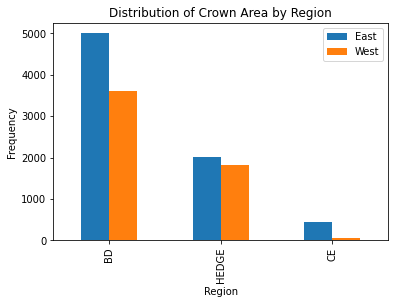

In [ ]:
# Get the count of each region in each DataFrame
east_counts = dfE['Functional'].value_counts()
west_counts = dfW['Functional'].value_counts()

# Create a new DataFrame with the counts for each region
data = pd.DataFrame({'East': east_counts, 'West': west_counts})

# Plot the bar chart
data.plot(kind='bar')
plt.xlabel('Region')
plt.ylabel('Frequency')
plt.title('Distribution of Crown Area by Region')
plt.show()